In [65]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns

## Public School Teachers

In [3]:
excel_file = pd.ExcelFile("C:/Users/franj/notebooks/public school teachers/public school teachers.xlsx")

# Sheets you want to combine
sheet_names = excel_file.sheet_names

for sheet in sheet_names:
    df = pd.read_excel(excel_file, sheet_name=sheet)
    print(f"--- Sheet: {sheet} ---")
    print(df.head())
    print(df.head())
    print("\n")

--- Sheet: Elementary ---
                       Region  SY 2010-2011  SY 2011-2012  SY 2012-2013  \
0    Region I - Ilocos Region         21604         21790         22235   
1  Region II - Cagayan Valley         14728         14521         15284   
2  Region III - Central Luzon         34952         35418         36417   
3    Region IV-A - CALABARZON         37190         37501         39513   
4      Region IV-B - MIMAROPA         12900         13215         13622   

   SY 2013-2014  SY 2014-2015  SY 2015-2016  SY 2016-2017  SY 2017-2018  \
0         22779         23071         24138         24237         24768   
1         16038         16435         17857         18098         18420   
2         38774         39972         43501         43342         44493   
3         43299         45219         49264         49530         51167   
4         14826         15516         17279         16982         17394   

   SY 2018-2019  SY 2019-2020  SY 2020-2021  
0         25737         25

In [4]:
df.shape

(17, 6)

In [5]:
for sheet in sheet_names:
    df = pd.read_excel("C:/Users/franj/notebooks/public school teachers/public school teachers.xlsx", sheet_name=sheet)
    print(f"{sheet}: {df.shape[0]} rows × {df.shape[1]} columns")

Elementary: 17 rows × 12 columns
Junior High School: 17 rows × 12 columns
Senior High School: 17 rows × 6 columns


In [6]:
df_list = []

# Loop and add "Level" column to each
for sheet in sheet_names:
    df = pd.read_excel(excel_file, sheet_name=sheet)
    df['Level'] = sheet  # Add sheet name as a column
    df_list.append(df)

# Combine all into one DataFrame
combined_df = pd.concat(df_list, ignore_index=True)

# Preview
print(combined_df.shape)
print(combined_df.head())

(51, 13)
                       Region  SY 2010-2011  SY 2011-2012  SY 2012-2013  \
0    Region I - Ilocos Region       21604.0       21790.0       22235.0   
1  Region II - Cagayan Valley       14728.0       14521.0       15284.0   
2  Region III - Central Luzon       34952.0       35418.0       36417.0   
3    Region IV-A - CALABARZON       37190.0       37501.0       39513.0   
4      Region IV-B - MIMAROPA       12900.0       13215.0       13622.0   

   SY 2013-2014  SY 2014-2015  SY 2015-2016  SY 2016-2017  SY 2017-2018  \
0       22779.0       23071.0       24138.0         24237         24768   
1       16038.0       16435.0       17857.0         18098         18420   
2       38774.0       39972.0       43501.0         43342         44493   
3       43299.0       45219.0       49264.0         49530         51167   
4       14826.0       15516.0       17279.0         16982         17394   

   SY 2018-2019  SY 2019-2020  SY 2020-2021       Level  
0         25737         25955  

In [7]:
# combined_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_teachers.csv", index=False)

In [8]:
df_teachers = pd.melt(
    combined_df,
    id_vars=["Region", "Level"],
    var_name="School Year",
    value_name="Teachers"
)

df_teachers

,Region,Level,School Year,Teachers
0,Region I - Ilocos Region,Elementary,SY 2010-2011,21604.0
1,Region II - Cagayan Valley,Elementary,SY 2010-2011,14728.0
2,Region III - Central Luzon,Elementary,SY 2010-2011,34952.0
3,Region IV-A - CALABARZON,Elementary,SY 2010-2011,37190.0
4,Region IV-B - MIMAROPA,Elementary,SY 2010-2011,12900.0
...,...,...,...,...
556,Region XII - Soccsksargen,Senior High School,SY 2020-2021,3691.0
557,CARAGA - CARAGA,Senior High School,SY 2020-2021,3106.0
558,BARMM - Bangsamoro Autonomous Region in Muslim...,Senior High School,SY 2020-2021,755.0
559,CAR - Cordillera Administrative Region,Senior High School,SY 2020-2021,1258.0


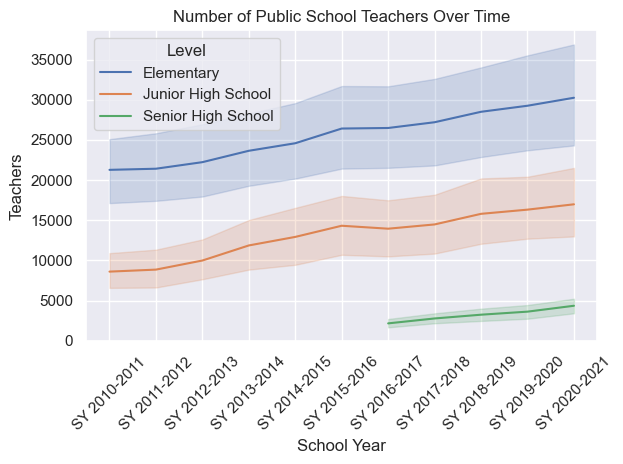

In [9]:
sns.set_theme(style="darkgrid")

sns.lineplot(
    x="School Year",
    y="Teachers",
    hue="Level",
    data=df_teachers
)

plt.xticks(rotation=45)
plt.title("Number of Public School Teachers Over Time")
plt.tight_layout()
plt.show()

In [10]:
# Group by 'Level' and 'School Year' and calculate the total number of teachers
total_teachers_by_category_and_school_year = df_teachers.groupby(['Level', 'School Year'])['Teachers'].sum().reset_index() 

# Rename columns for clarity
total_teachers_by_category_and_school_year.columns = ['School Category', 'Total Teachers', 'School Year']

# Display the result
print(total_teachers_by_category_and_school_year)

       School Category Total Teachers  School Year
0           Elementary   SY 2010-2011     361564.0
1           Elementary   SY 2011-2012     363955.0
2           Elementary   SY 2012-2013     377831.0
3           Elementary   SY 2013-2014     401913.0
4           Elementary   SY 2014-2015     417848.0
5           Elementary   SY 2015-2016     448966.0
6           Elementary   SY 2016-2017     450134.0
7           Elementary   SY 2017-2018     462299.0
8           Elementary   SY 2018-2019     484406.0
9           Elementary   SY 2019-2020     497200.0
10          Elementary   SY 2020-2021     514099.0
11  Junior High School   SY 2010-2011     146269.0
12  Junior High School   SY 2011-2012     150516.0
13  Junior High School   SY 2012-2013     169743.0
14  Junior High School   SY 2013-2014     201651.0
15  Junior High School   SY 2014-2015     219710.0
16  Junior High School   SY 2015-2016     243321.0
17  Junior High School   SY 2016-2017     237083.0
18  Junior High School   SY 201

## Elementary Public School Students

In [57]:
elementary = pd.ExcelFile("C:/Users/franj/notebooks/public school teachers/elementary.xlsx")

In [58]:
sheet_names = elementary.sheet_names

In [59]:
# List to hold the processed DataFrames for each sheet
df_list = []

# Loop through each sheet, sum male and female students per grade level
for sheet in sheet_names:
    # Read data from the sheet with multi-level headers
    df = pd.read_excel(elementary, sheet_name=sheet, header=[0, 1])
    
    # Flatten the multi-level columns
    df.columns = [' '.join(col).strip() for col in df.columns]
    
    # Rename the "Region Unnamed: 0_level_1" column back to "Region"
    df.rename(columns={"Region Unnamed: 0_level_1": "Region"}, inplace=True)
    
    # Debug: Print the columns to verify
    print(f"Flattened columns for sheet '{sheet}': {df.columns}")
    
    # Ensure the 'Region' column exists
    if 'Region' not in df.columns:
        raise KeyError(f"'Region' column not found in sheet '{sheet}'")
    
    # Identify grade level columns dynamically
    grade_levels = set(col.rsplit(' ', 1)[0] for col in df.columns if "Male" in col or "Female" in col)
    
    # Debug: Print identified grade levels
    print(f"Identified grade levels for sheet '{sheet}': {grade_levels}")
    
    # Create a new DataFrame to store totals per grade level
    grade_totals = pd.DataFrame()
    grade_totals['Region'] = df['Region']  # Keep the "Region" column
    
    for grade in grade_levels:
        male_col = f"{grade} Male"
        female_col = f"{grade} Female"
        
        if male_col in df.columns and female_col in df.columns:
            # Sum "Male" and "Female" columns for the grade level
            grade_totals[grade] = df[male_col] + df[female_col]
    
    # Add a 'School Year' column to keep track of which year it came from
    grade_totals['School Year'] = sheet
    
    # Append the processed DataFrame to the list
    df_list.append(grade_totals)

# Concatenate all DataFrames together into one large DataFrame
combined_df = pd.concat(df_list, ignore_index=True)

# Export to CSV
# combined_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_elementary.csv", index=False)

# Preview the combined DataFrame
print(combined_df)

Flattened columns for sheet '2010-2011': Index(['Region', 'Kindergarten Male', 'Kindergarten Female', 'Grade 1 Male',
       'Grade 1 Female', 'Grade 2 Male', 'Grade 2 Female', 'Grade 3 Male',
       'Grade 3 Female', 'Grade 4 Male', 'Grade 4 Female', 'Grade 5 Male',
       'Grade 5 Female', 'Grade 6 Male', 'Grade 6 Female'],
      dtype='object')
Identified grade levels for sheet '2010-2011': {'Grade 1', 'Grade 6', 'Grade 3', 'Grade 4', 'Grade 5', 'Kindergarten', 'Grade 2'}
Flattened columns for sheet '2011-2012': Index(['Region', 'Kindergarten Male', 'Kindergarten Female', 'Grade 1 Male',
       'Grade 1 Female', 'Grade 2 Male', 'Grade 2 Female', 'Grade 3 Male',
       'Grade 3 Female', 'Grade 4 Male', 'Grade 4 Female', 'Grade 5 Male',
       'Grade 5 Female', 'Grade 6 Male', 'Grade 6 Female'],
      dtype='object')
Identified grade levels for sheet '2011-2012': {'Grade 1', 'Grade 6', 'Grade 3', 'Grade 4', 'Grade 5', 'Kindergarten', 'Grade 2'}
Flattened columns for sheet '2012-2013':

In [60]:
combined_df.columns

Index(['Region', 'Grade 1', 'Grade 6', 'Grade 3', 'Grade 4', 'Grade 5',
       'Kindergarten', 'Grade 2', 'School Year', 'Non-Grade (ES)'],
      dtype='object')

In [61]:
combined_df = combined_df[['Region', 'Kindergarten', 'Grade 1', 'Grade 2', 'Grade 3', 'Grade 4', 'Grade 5', 'Grade 6', 'Non-Grade (ES)','School Year']]

print(combined_df)

                                                Region  Kindergarten  Grade 1  \
0                             Region I - Ilocos Region         84553   120004   
1                           Region II - Cagayan Valley         27079    83959   
2                           Region III - Central Luzon        141901   258235   
3                             Region IV-A - CALABARZON        135149   311562   
4                               Region IV-B - MIMAROPA         47289   100391   
..                                                 ...           ...      ...   
182                          Region XII - Soccsksargen         95290    96596   
183                                    CARAGA - CARAGA         60342    59573   
184  BARMM - Bangsamoro Autonomous Region in Muslim...         88218    92456   
185             CAR - Cordillera Administrative Region         31801    28883   
186                      NCR - National Capital Region        160389   174573   

     Grade 2  Grade 3  Grad

In [62]:
melted_df = pd.melt(
    combined_df,
    id_vars=["Region", "School Year"],
    value_vars=["Kindergarten", "Grade 1", "Grade 2", "Grade 3", "Grade 4", "Grade 5", "Grade 6", "Non-Grade (ES)"],
    var_name="Grade Level",
    value_name="Students"
)

melted_df

,Region,School Year,Grade Level,Students
0,Region I - Ilocos Region,2010-2011,Kindergarten,84553.0
1,Region II - Cagayan Valley,2010-2011,Kindergarten,27079.0
2,Region III - Central Luzon,2010-2011,Kindergarten,141901.0
3,Region IV-A - CALABARZON,2010-2011,Kindergarten,135149.0
4,Region IV-B - MIMAROPA,2010-2011,Kindergarten,47289.0
...,...,...,...,...
1491,Region XII - Soccsksargen,2020-2021,Non-Grade (ES),1455.0
1492,CARAGA - CARAGA,2020-2021,Non-Grade (ES),1514.0
1493,BARMM - Bangsamoro Autonomous Region in Muslim...,2020-2021,Non-Grade (ES),218.0
1494,CAR - Cordillera Administrative Region,2020-2021,Non-Grade (ES),606.0


In [63]:
# melted_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_elementary.csv", index=False)

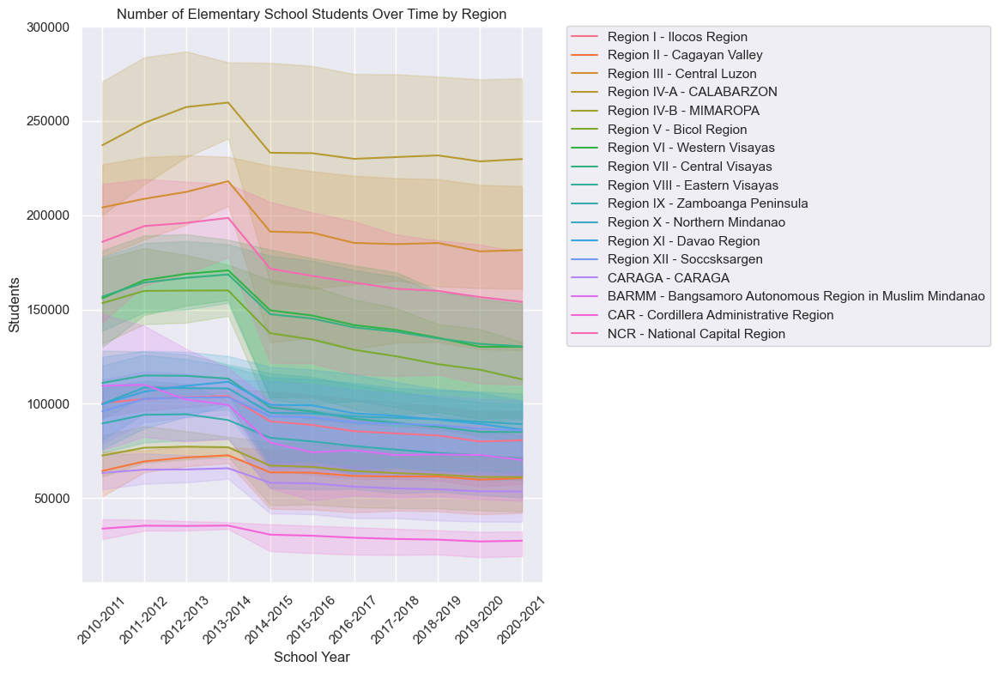

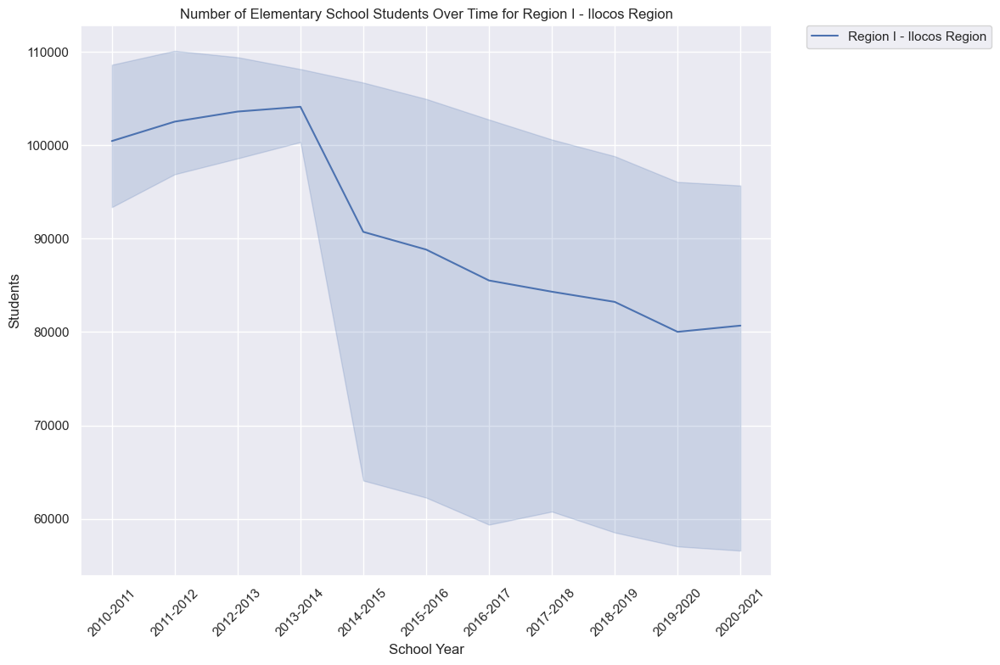

--- Region I - Ilocos Region ---


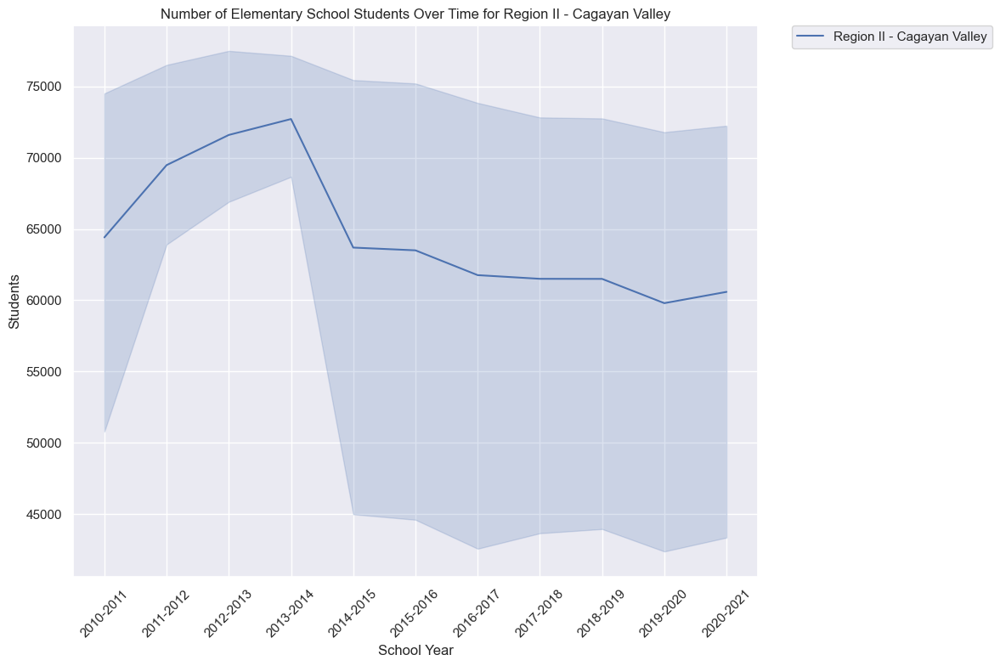

--- Region II - Cagayan Valley ---


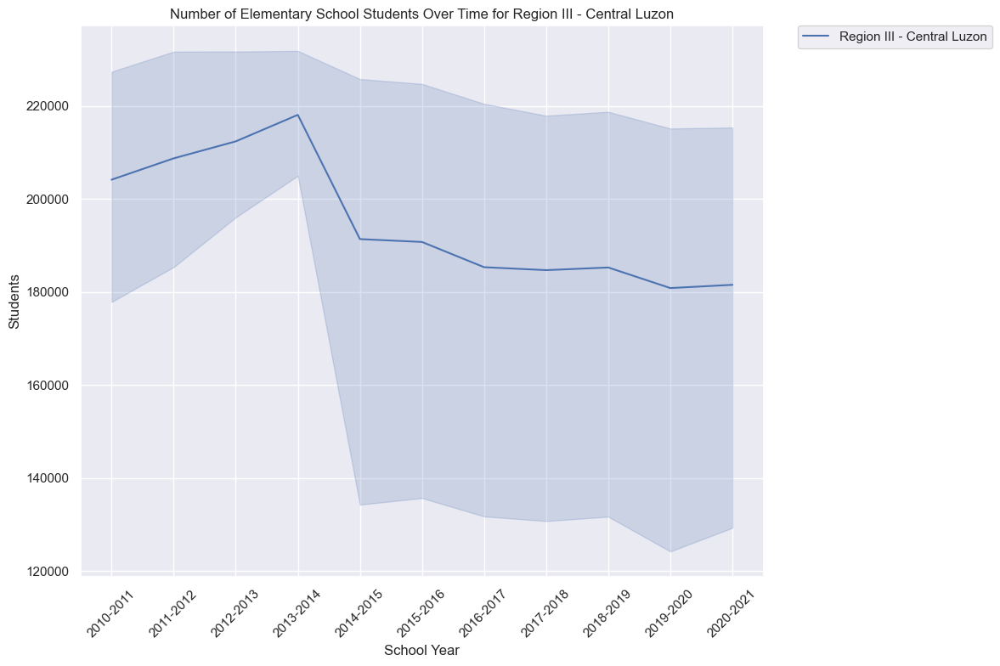

--- Region III - Central Luzon ---


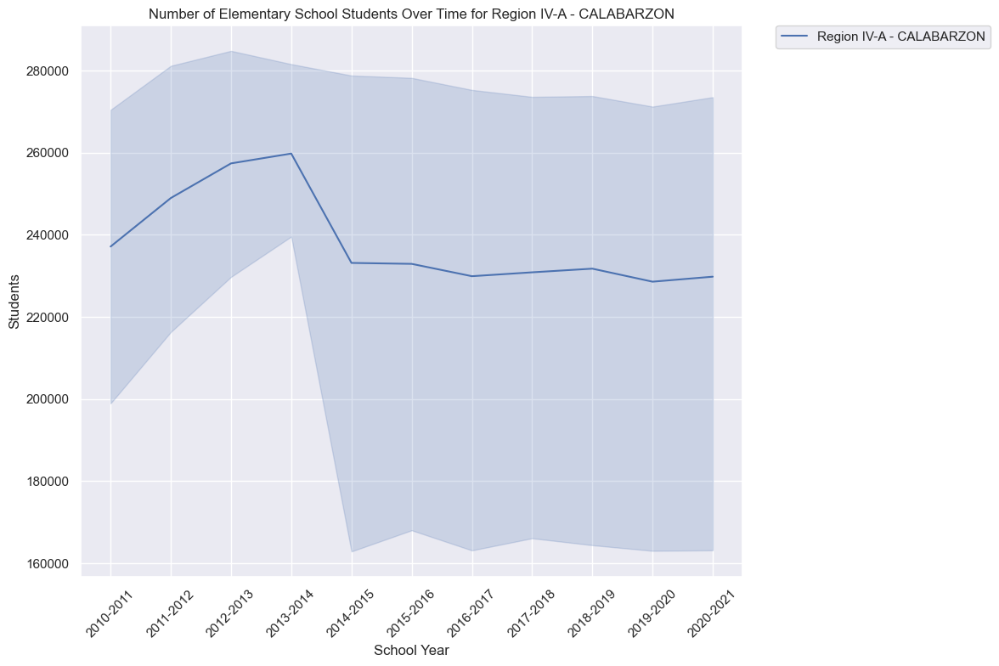

--- Region IV-A - CALABARZON ---


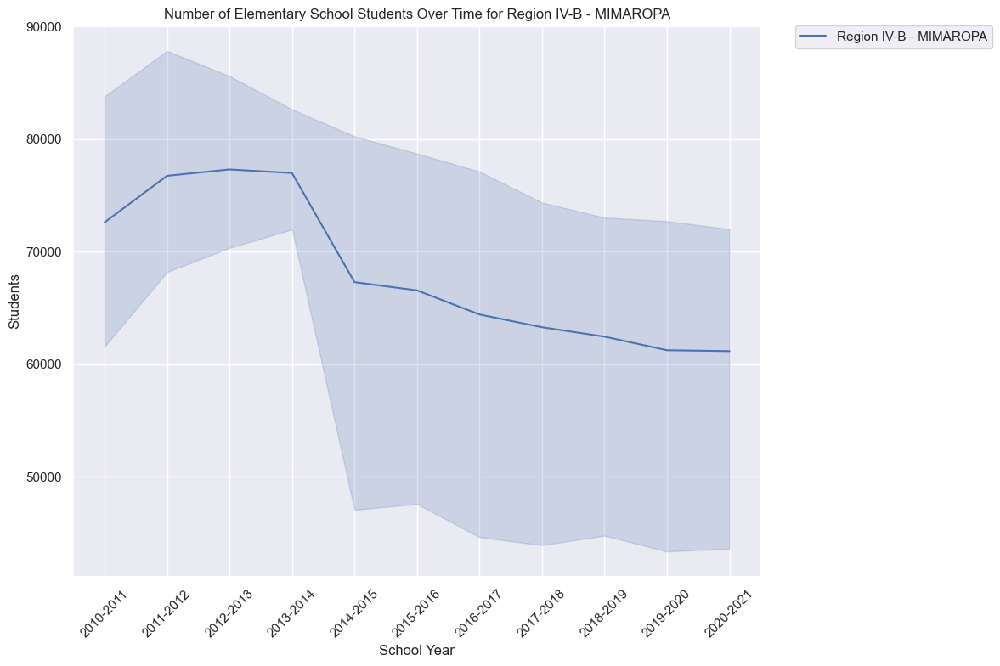

--- Region IV-B - MIMAROPA ---


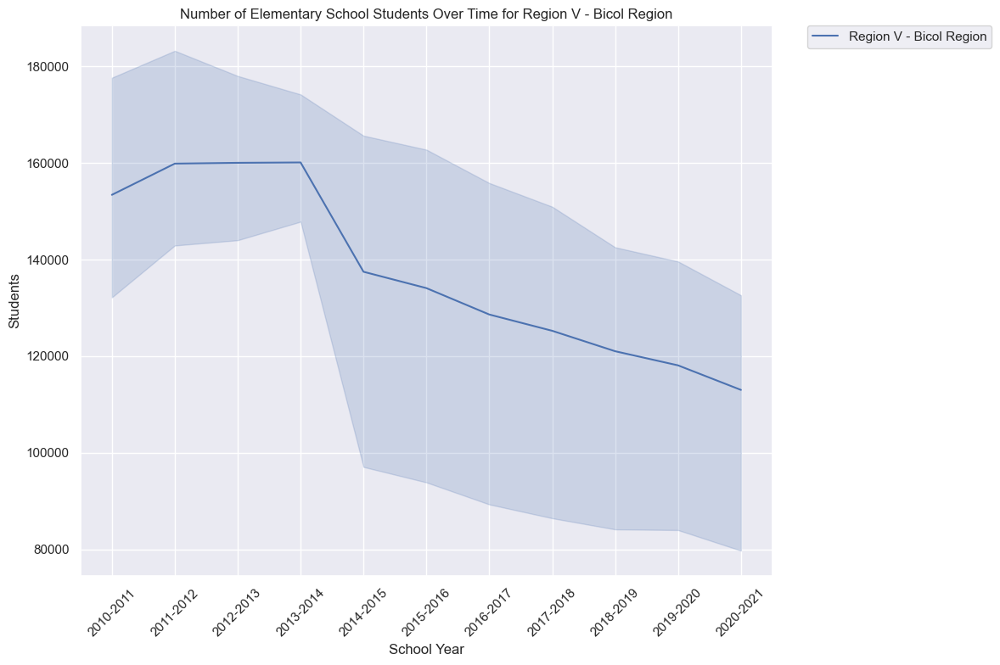

--- Region V - Bicol Region ---


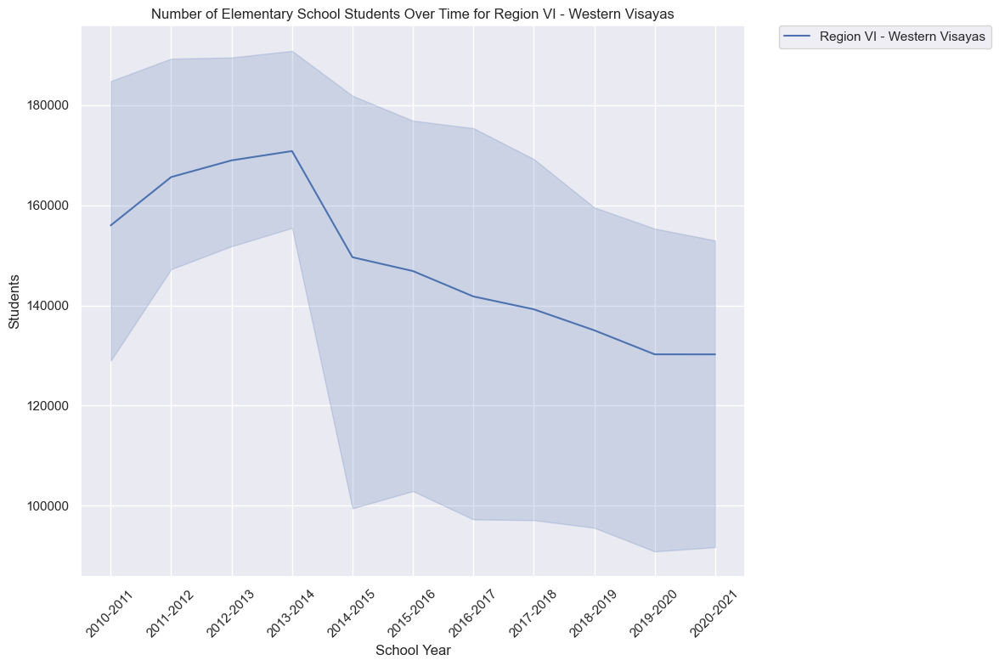

--- Region VI - Western Visayas ---


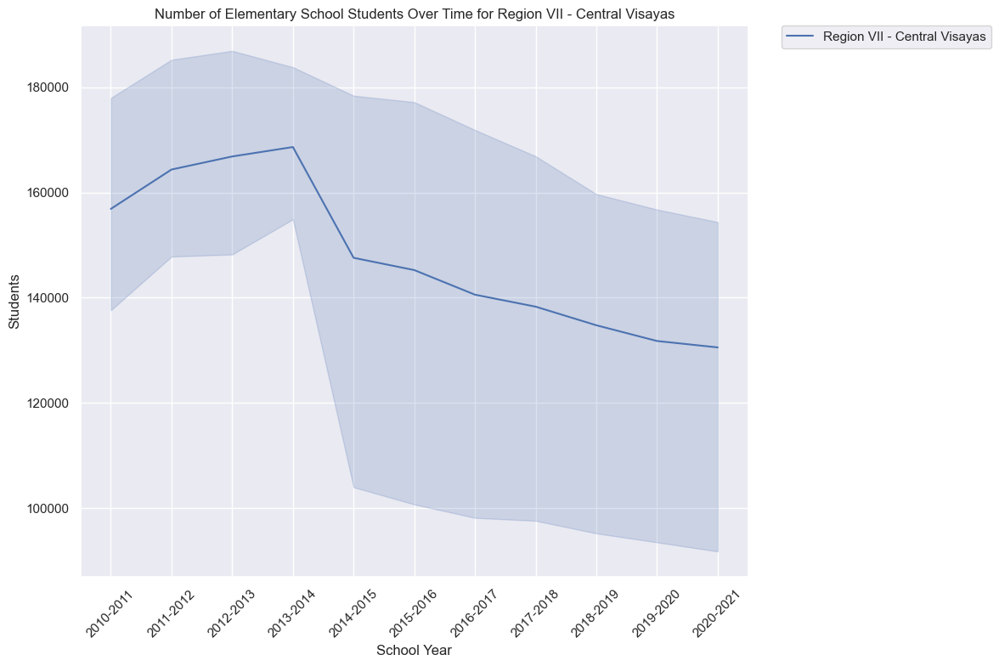

--- Region VII - Central Visayas ---


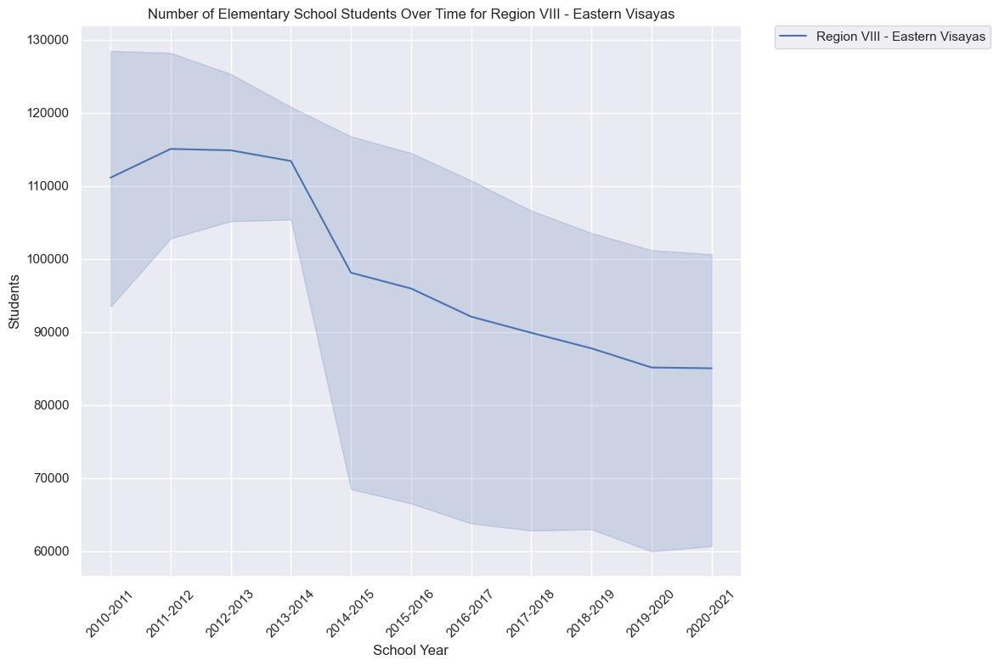

--- Region VIII - Eastern Visayas ---


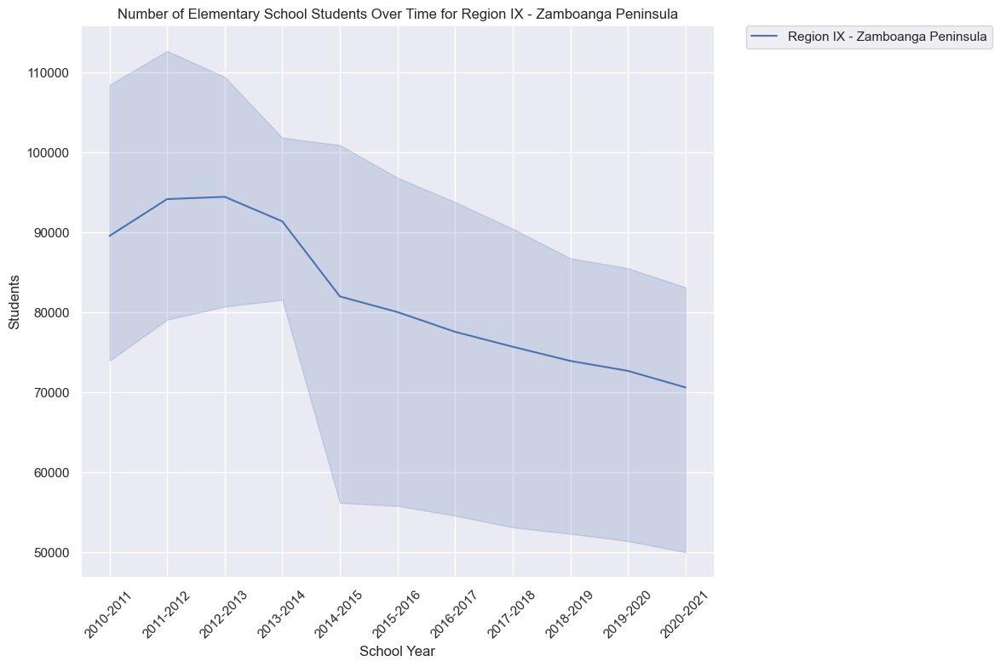

--- Region IX - Zamboanga Peninsula ---


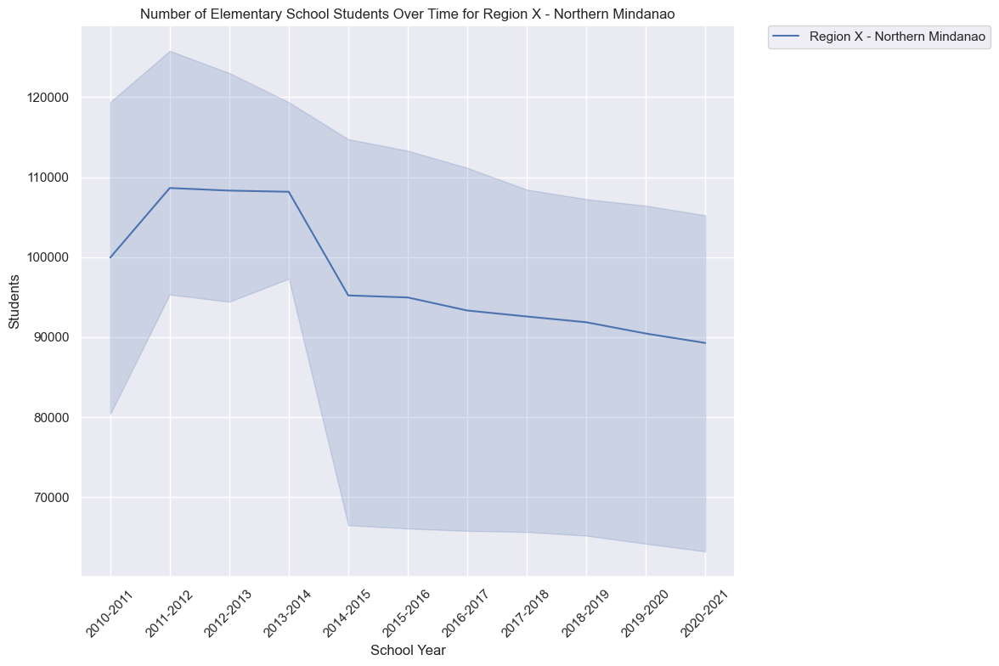

--- Region X - Northern Mindanao ---


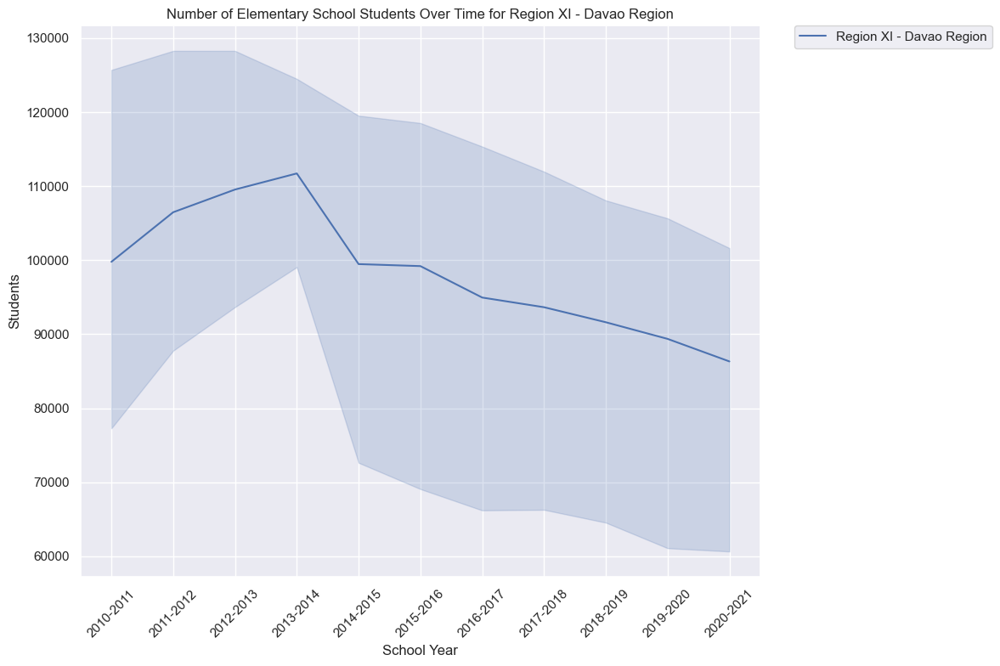

--- Region XI - Davao Region ---


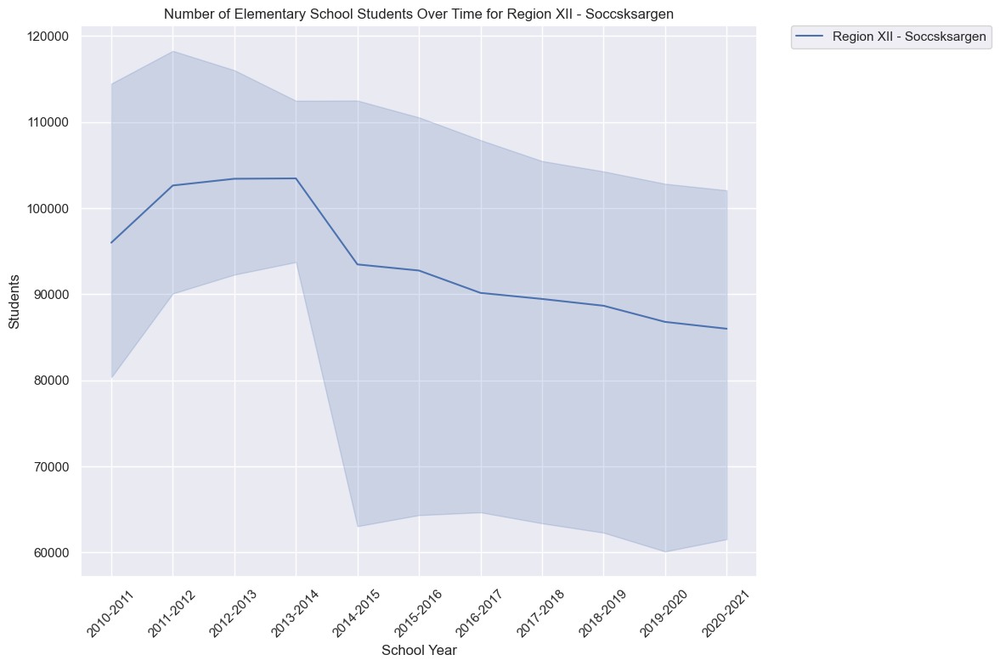

--- Region XII - Soccsksargen ---


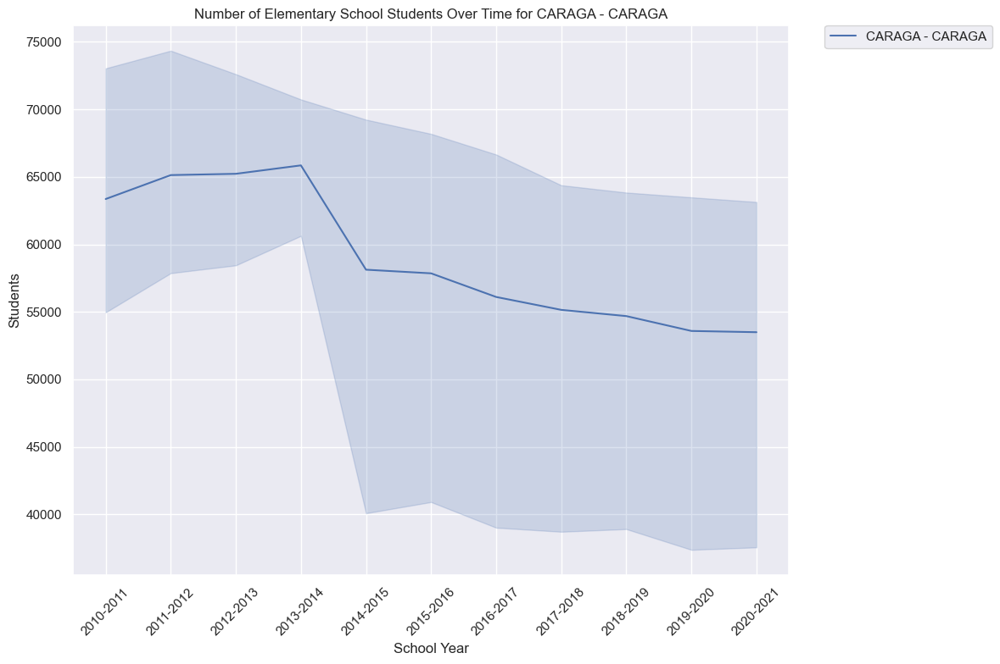

--- CARAGA - CARAGA ---


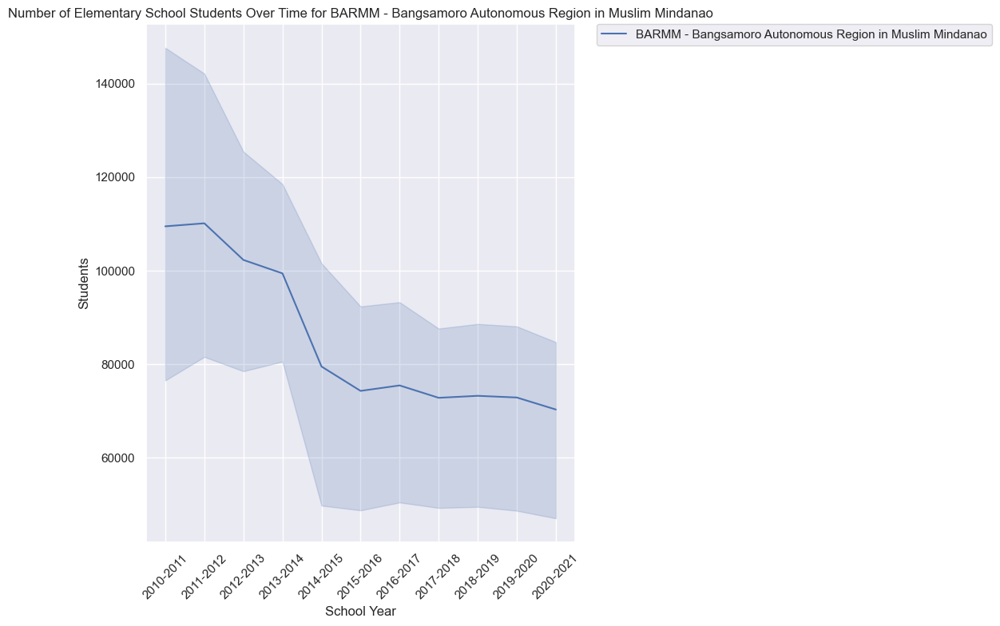

--- BARMM - Bangsamoro Autonomous Region in Muslim Mindanao ---


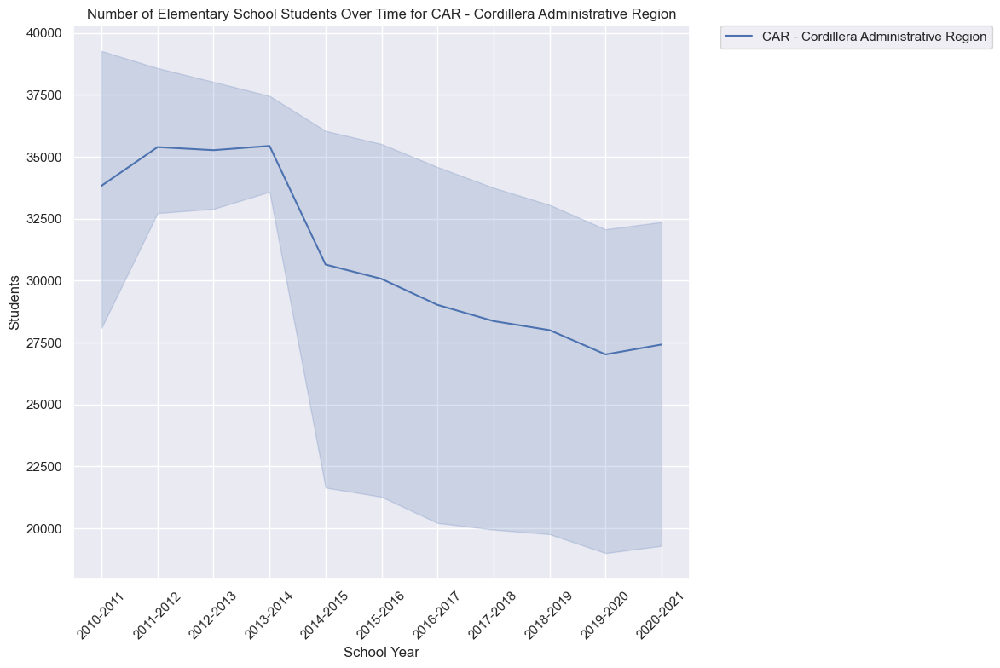

--- CAR - Cordillera Administrative Region ---


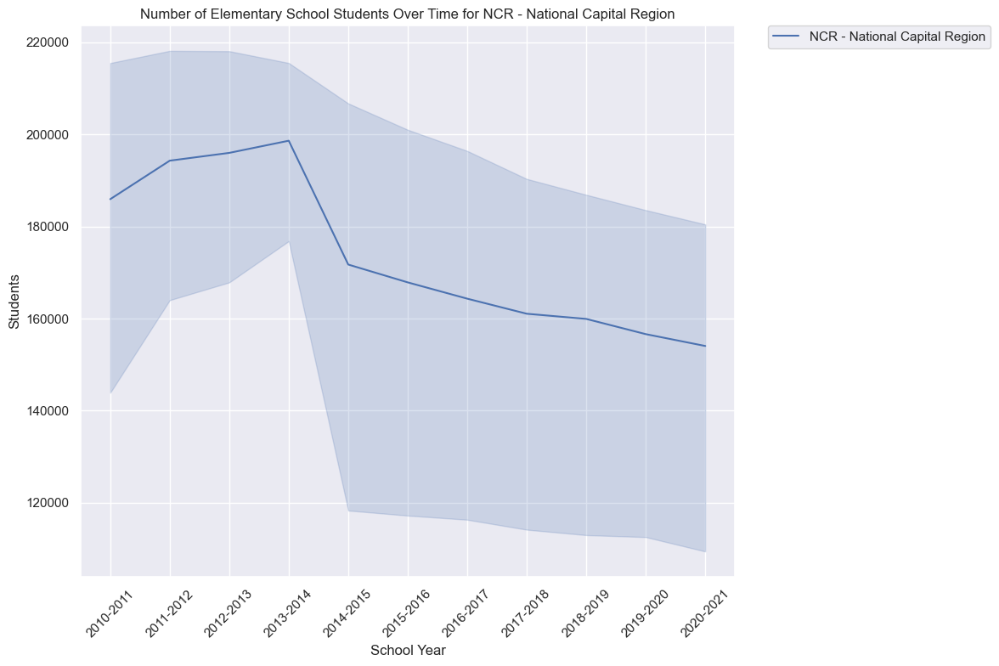

--- NCR - National Capital Region ---


In [64]:
def number_of_students_over_time_and_region(melted_df, region=None):
    sns.set_theme(style="darkgrid")

    # Ensure 'School Year' is treated as a categorical variable for better visualization
    melted_df['School Year'] = melted_df['School Year'].astype(str)
    
    # Create a figure
    plt.figure(figsize=(12, 8))
    
    if region:
        # Filter for specific region if provided
        filtered_df = melted_df[melted_df['Region'] == region]
        title_suffix = f" for {region}"
    else:
        # Use all regions
        filtered_df = melted_df
        title_suffix = " by Region"
    
    # Create the line plot
    sns.lineplot(
        x="School Year",
        y="Students",
        hue="Region",  # Use Region as the hue
        data=filtered_df
    )
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Add a title and adjust layout
    plt.title(f"Number of Elementary School Students Over Time{title_suffix}")
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    # Adjust layout to prevent clipping
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Call the function with all regions
number_of_students_over_time_and_region(melted_df)

# Alternatively, call it for each region
regions = melted_df['Region'].unique()
for region in regions:
    number_of_students_over_time_and_region(melted_df, region)
    print(f"--- {region} ---")

In [19]:
# Group by 'Level' and 'School Year' and calculate the total number of students
total_students_by_category_and_school_year = melted_df.groupby(['School Year'])['Students'].sum().reset_index()

# Rename columns for clarity
total_teachers_by_category_and_school_year.columns = ['School Category', 'Total Students', 'School Year']

# Display the result
print(total_students_by_category_and_school_year)

   School Year    Students
0    2010-2011  14238772.0
1    2011-2012  14898142.0
2    2012-2013  15032994.0
3    2013-2014  15111655.0
4    2014-2015  15114208.0
5    2015-2016  14894646.0
6    2016-2017  14488231.0
7    2017-2018  14289445.0
8    2018-2019  14118252.0
9    2019-2020  13801750.0
10   2020-2021  13681248.0


In [20]:
# Rename 'Grade Level' to 'Level' in melted_df to match df_teachers
melted_df.rename(columns={'Grade Level': 'Level'}, inplace=True)

# rename school years in df_teachers to match melted_df
df_teachers['School Year'] = df_teachers['School Year'].str.replace('SY ', '')

In [21]:
# Filter df_teachers to include only "Elementary" level
elementary_teachers = df_teachers[df_teachers['Level'] == 'Elementary']

# Group teachers by 'School Year' and 'Region' and calculate the total number of teachers
teachers_by_year_region = elementary_teachers.groupby(['School Year', 'Region'])['Teachers'].sum().reset_index()

# Group students by 'School Year' and 'Region' and calculate the total number of students
students_by_year_region = melted_df.groupby(['School Year', 'Region'])['Students'].sum().reset_index()

# Merge the two DataFrames on 'School Year' and 'Region'
ratio_df = pd.merge(teachers_by_year_region, students_by_year_region, on=['School Year', 'Region'], how='inner')

# Calculate the ratio of teachers to students
ratio_df['Student-to-Teacher Ratio'] = ratio_df['Students'] / ratio_df['Teachers']

# Display the resulting DataFrame
print(ratio_df)

    School Year                                             Region  Teachers  \
0     2010-2011  BARMM - Bangsamoro Autonomous Region in Muslim...   14317.0   
1     2010-2011             CAR - Cordillera Administrative Region    7848.0   
2     2010-2011                                    CARAGA - CARAGA   11569.0   
3     2010-2011                      NCR - National Capital Region   31314.0   
4     2010-2011                           Region I - Ilocos Region   21604.0   
..          ...                                                ...       ...   
182   2020-2021                       Region VII - Central Visayas   40653.0   
183   2020-2021                      Region VIII - Eastern Visayas   30620.0   
184   2020-2021                       Region X - Northern Mindanao   26810.0   
185   2020-2021                           Region XI - Davao Region   26010.0   
186   2020-2021                          Region XII - Soccsksargen   25244.0   

      Students  Student-to-Teacher Rati

In [22]:
ratio_df['Student-to-Teacher Ratio'].describe()

count    187.000000
mean      33.411713
std        6.632820
min       19.930317
25%       28.378309
50%       32.788406
75%       38.313973
max       58.836691
Name: Student-to-Teacher Ratio, dtype: float64

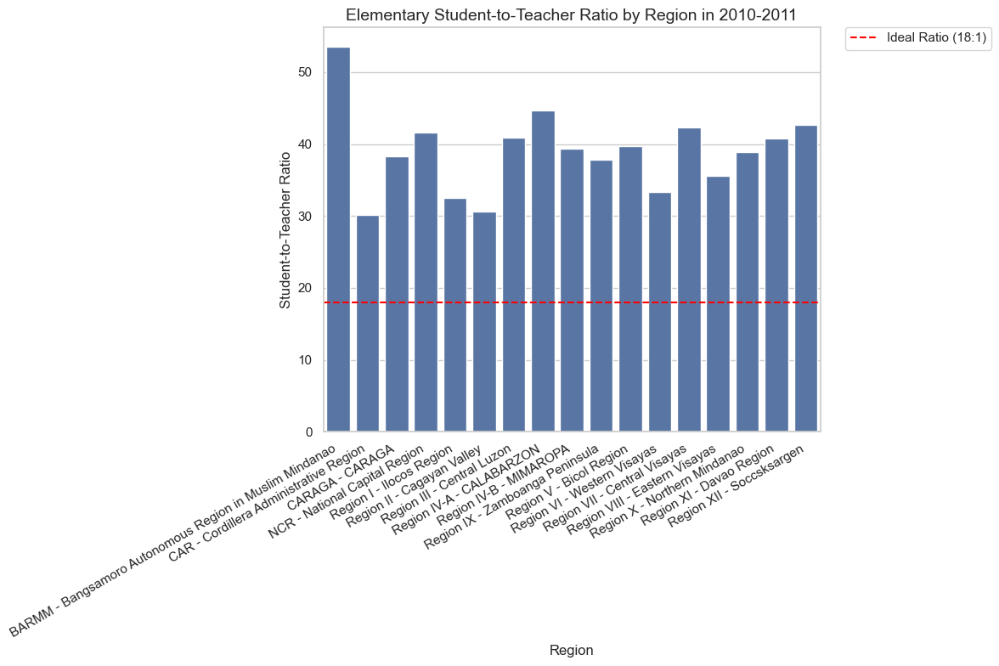

--- 2010-2011 ---


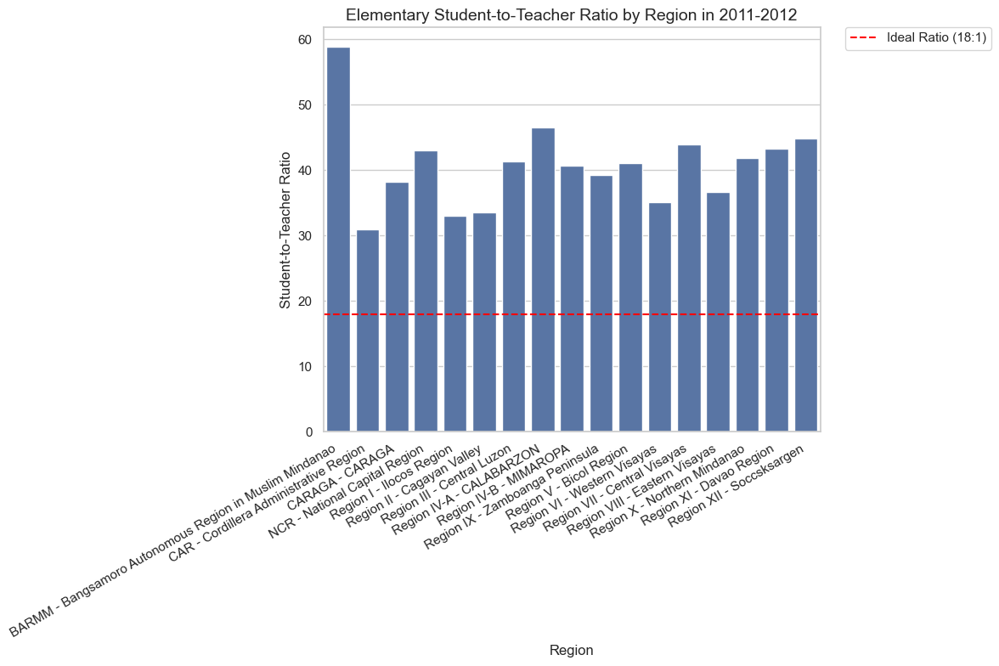

--- 2011-2012 ---


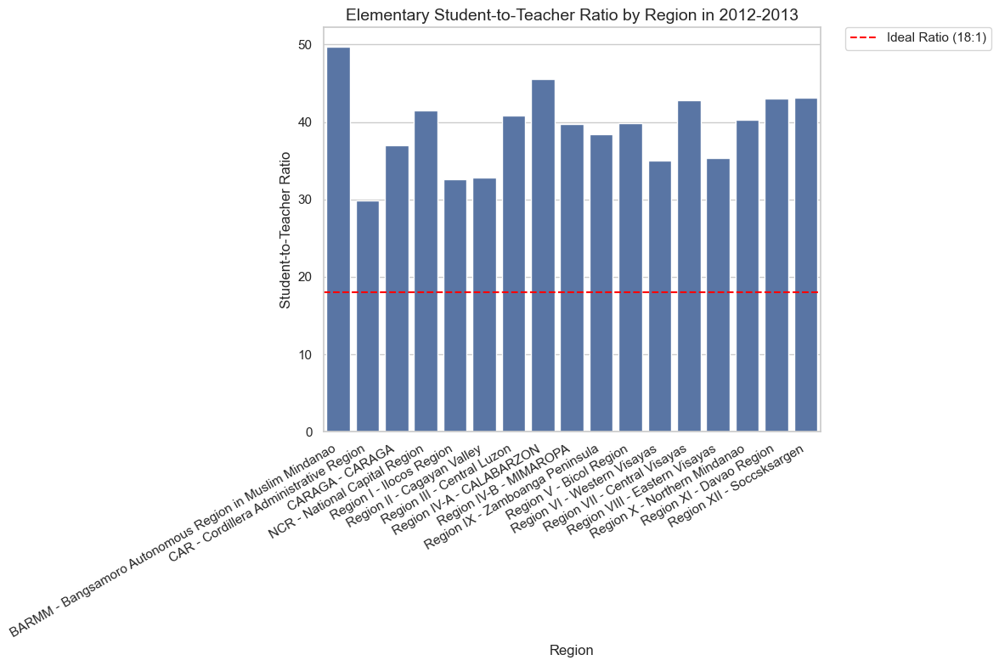

--- 2012-2013 ---


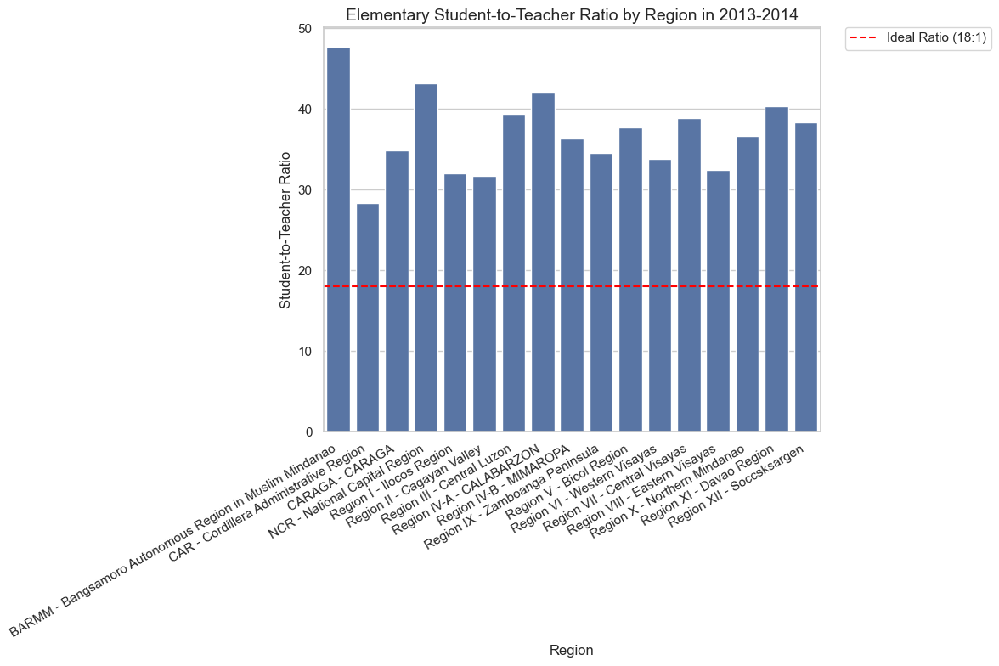

--- 2013-2014 ---


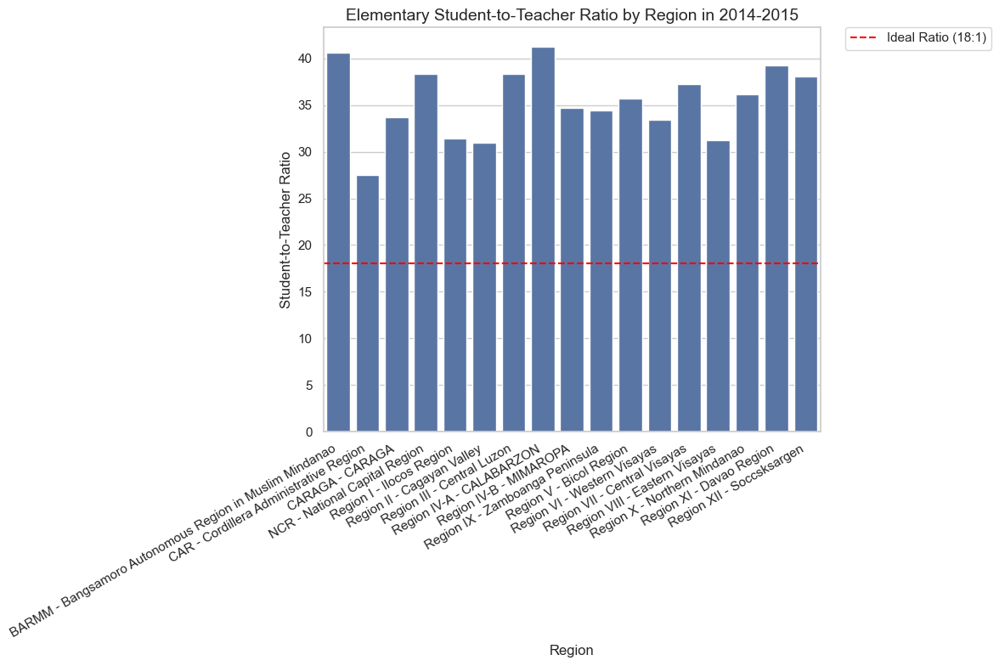

--- 2014-2015 ---


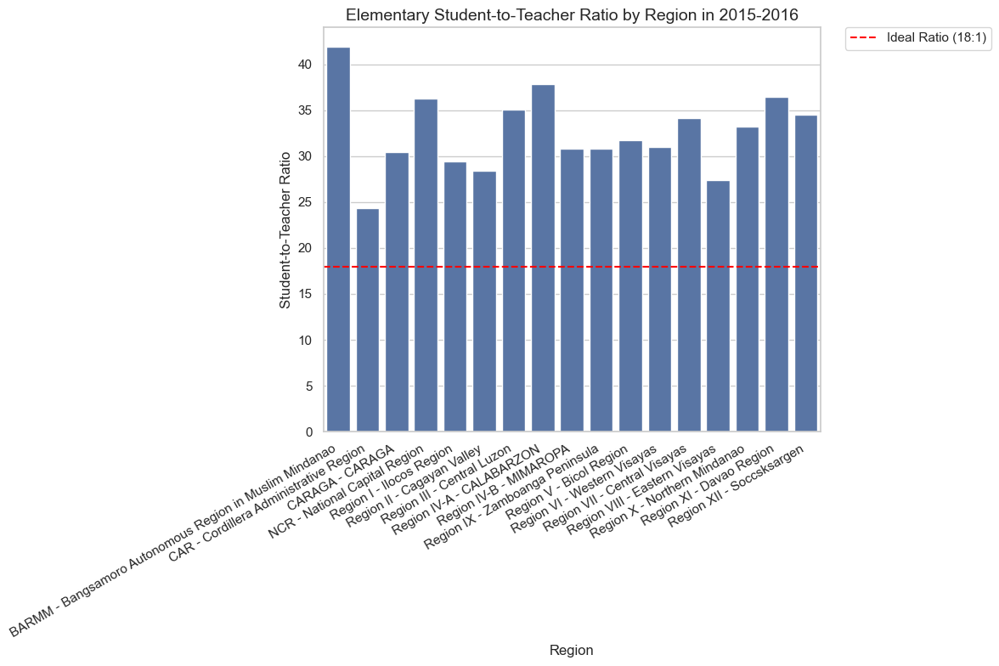

--- 2015-2016 ---


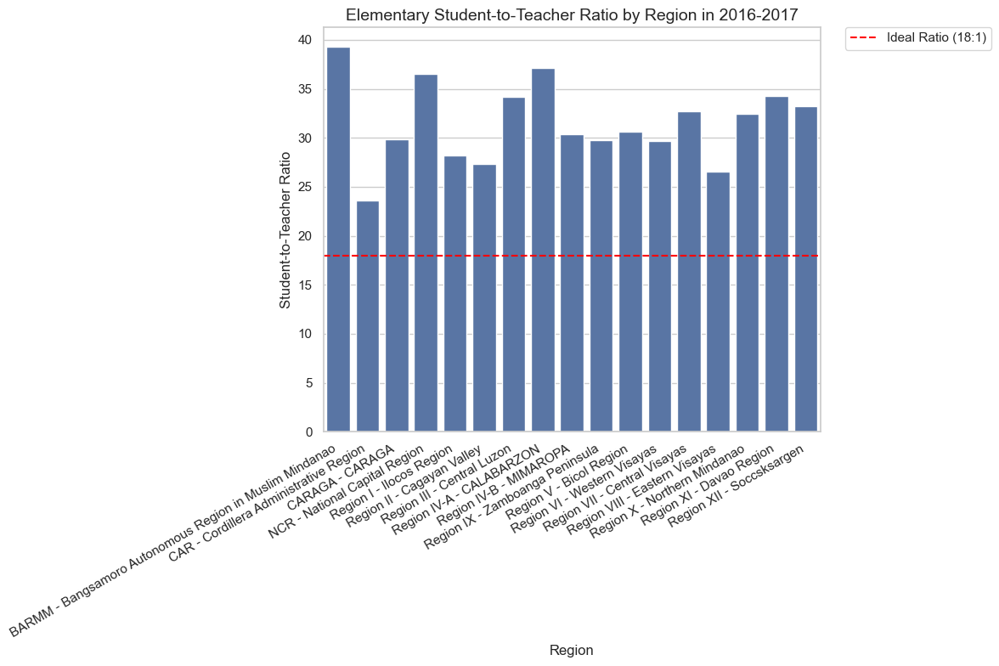

--- 2016-2017 ---


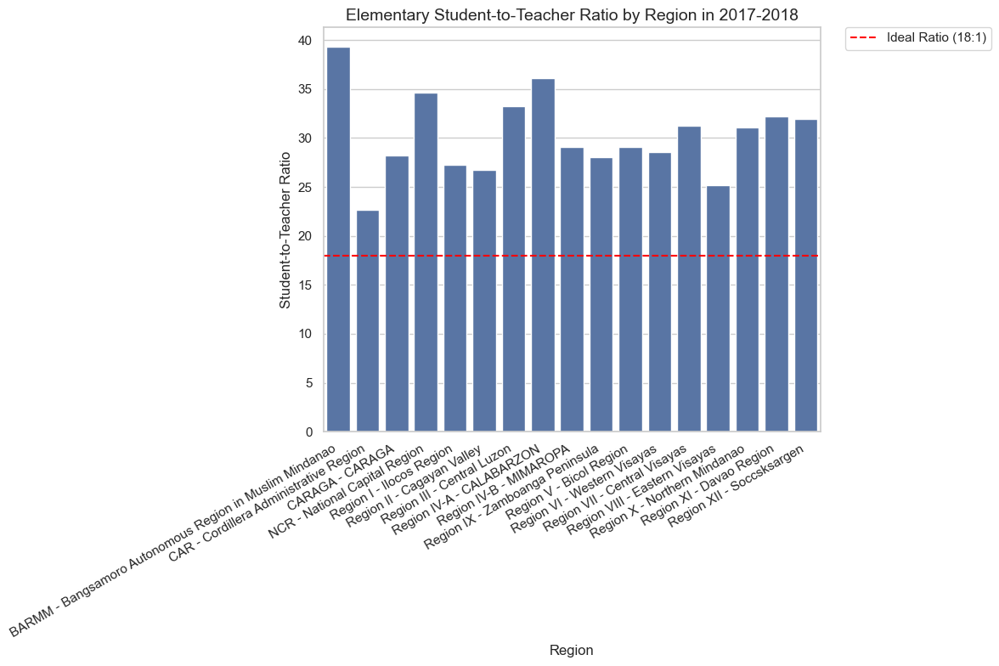

--- 2017-2018 ---


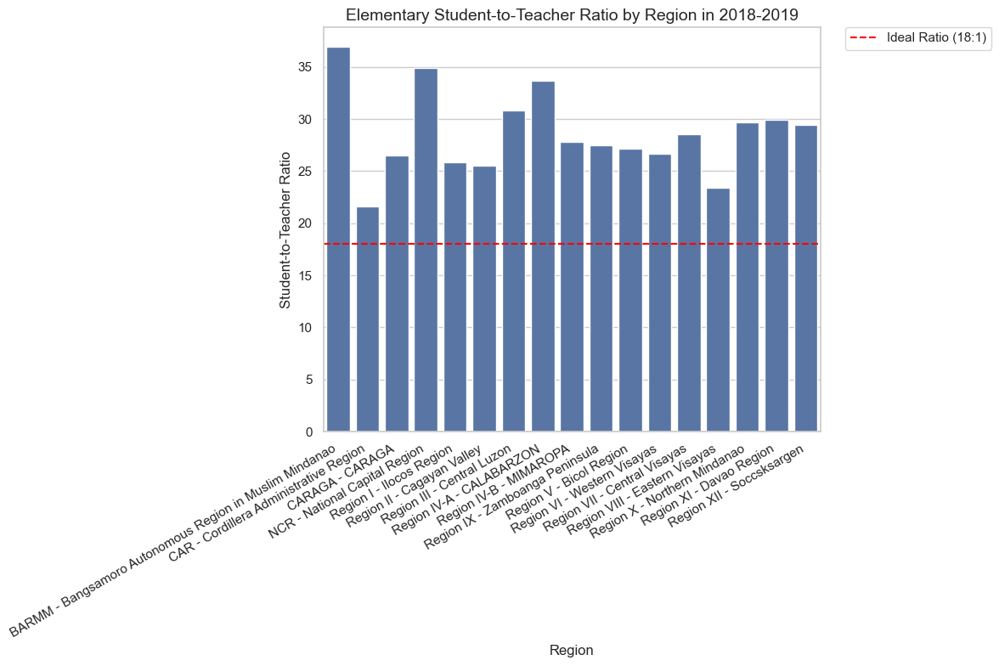

--- 2018-2019 ---


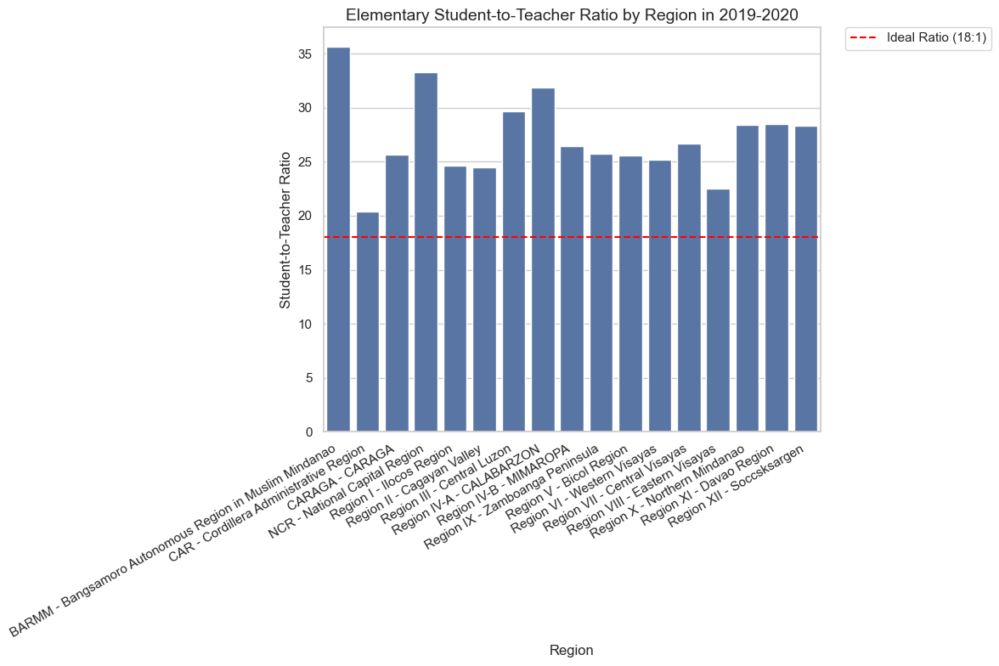

--- 2019-2020 ---


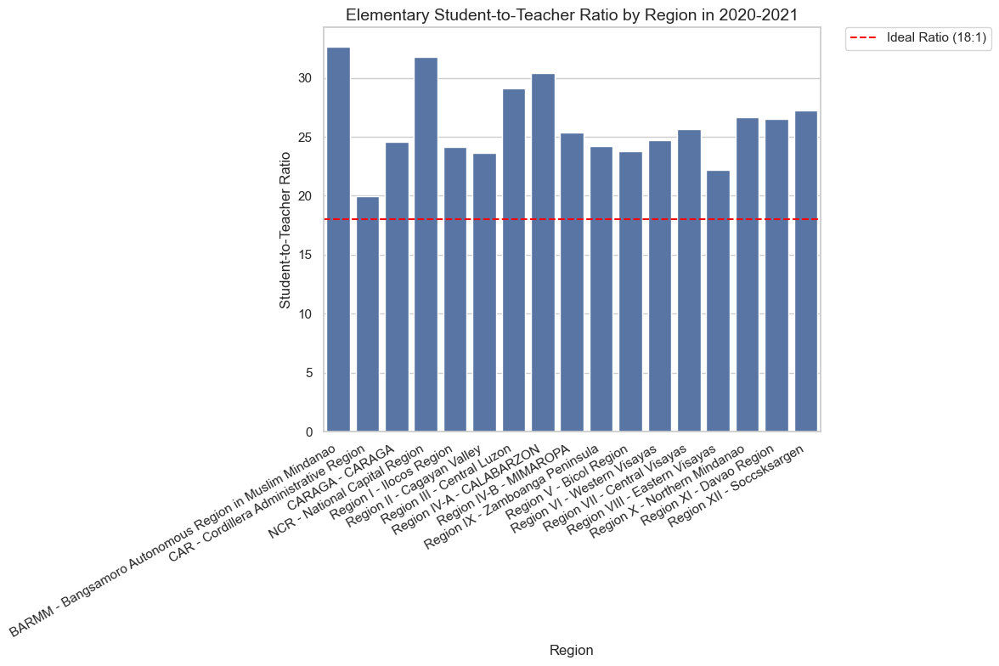

--- 2020-2021 ---


In [23]:
def filter_and_plot_ratio(ratio_df, school_year):
    # Filter the DataFrame for the given school year
    student_teacher = ratio_df[ratio_df['School Year'] == school_year]
    student_teacher = student_teacher[['Region', 'School Year', 'Student-to-Teacher Ratio']]

    sns.set_theme(style="whitegrid")

    plt.figure(figsize=(12, 8))  # Increased figure size for better spacing
    sns.barplot(data=student_teacher, x="Region", y="Student-to-Teacher Ratio", dodge=True)

    plt.axhline(y=18, color='red', linestyle='--', label="Ideal Ratio (18:1)")

    plt.title(f"Elementary Student-to-Teacher Ratio by Region in {school_year}", fontsize=14)
    plt.xlabel("Region", fontsize=12)
    plt.ylabel("Student-to-Teacher Ratio", fontsize=12)
    plt.xticks(rotation=30, ha='right')  # Rotated labels and aligned them to the right
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    plt.tight_layout()

    plt.show()

# Loop through the school years and call the function
for year in ['2010-2011', '2011-2012', '2012-2013', '2013-2014', '2014-2015', 
             '2015-2016', '2016-2017', '2017-2018', '2018-2019', '2019-2020', '2020-2021']:
    filter_and_plot_ratio(ratio_df, year)
    print(f"--- {year} ---")

## Junior High Public School Students

In [49]:
junior_high = pd.ExcelFile("C:/Users/franj/notebooks/public school teachers/junior high school.xlsx")

In [50]:
sheet_names = junior_high.sheet_names

In [51]:
df_list = []

# Loop through each sheet, sum male and female students per grade level
for sheet in sheet_names:
    # Read data from the sheet with multi-level headers
    df = pd.read_excel(junior_high, sheet_name=sheet, header=[0, 1])
    
    # Flatten the multi-level columns
    df.columns = [' '.join(col).strip() for col in df.columns]
    
    # Rename the "Region Unnamed: 0_level_1" column back to "Region"
    df.rename(columns={"Region Unnamed: 0_level_1": "Region"}, inplace=True)
    
    # Debug: Print the columns to verify
    print(f"Flattened columns for sheet '{sheet}': {df.columns}")
    
    # Ensure the 'Region' column exists
    if 'Region' not in df.columns:
        raise KeyError(f"'Region' column not found in sheet '{sheet}'")
    
    # Identify grade level columns dynamically
    grade_levels = set(col.rsplit(' ', 1)[0] for col in df.columns if "Male" in col or "Female" in col)
    
    # Debug: Print identified grade levels
    print(f"Identified grade levels for sheet '{sheet}': {grade_levels}")
    
    # Create a new DataFrame to store totals per grade level
    grade_totals = pd.DataFrame()
    grade_totals['Region'] = df['Region']  # Keep the "Region" column
    
    for grade in grade_levels:
        male_col = f"{grade} Male"
        female_col = f"{grade} Female"
        
        if male_col in df.columns and female_col in df.columns:
            # Sum "Male" and "Female" columns for the grade level
            grade_totals[grade] = df[male_col] + df[female_col]
    
    # Add a 'School Year' column to keep track of which year it came from
    grade_totals['School Year'] = sheet
    
    # Append the processed DataFrame to the list
    df_list.append(grade_totals)

# Concatenate all DataFrames together into one large DataFrame
combined_df = pd.concat(df_list, ignore_index=True)

# Export to CSV
# combined_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_junior_high.csv", index=False)

# Preview the combined DataFrame
print(combined_df)

Flattened columns for sheet '2010-2011': Index(['Region', 'Grade 7 Male', 'Grade 7 Female', 'Grade 8 Male',
       'Grade 8 Female', 'Grade 9 Male', 'Grade 9 Female', 'Grade 10 Male',
       'Grade 10 Female'],
      dtype='object')
Identified grade levels for sheet '2010-2011': {'Grade 8', 'Grade 9', 'Grade 10', 'Grade 7'}
Flattened columns for sheet '2011-2012': Index(['Region', 'Grade 7 Male', 'Grade 7 Female', 'Grade 8 Male',
       'Grade 8 Female', 'Grade 9 Male', 'Grade 9 Female', 'Grade 10 Male',
       'Grade 10 Female'],
      dtype='object')
Identified grade levels for sheet '2011-2012': {'Grade 8', 'Grade 9', 'Grade 10', 'Grade 7'}
Flattened columns for sheet '2012-2013': Index(['Region', 'Grade 7 Male', 'Grade 7 Female', 'Grade 8 Male',
       'Grade 8 Female', 'Grade 9 Male', 'Grade 9 Female', 'Grade 10 Male',
       'Grade 10 Female'],
      dtype='object')
Identified grade levels for sheet '2012-2013': {'Grade 8', 'Grade 9', 'Grade 10', 'Grade 7'}
Flattened columns for 

In [52]:
combined_df.columns

Index(['Region', 'Grade 8', 'Grade 9', 'Grade 10', 'Grade 7', 'School Year',
       'Non-Grade (SS)', 'Non-Grade (JHS)'],
      dtype='object')

In [53]:
combined_df = combined_df[['Region', 'Grade 7', 'Grade 8', 'Grade 9', 'Grade 10', 'Non-Grade (SS)', 'Non-Grade (JHS)', 'School Year' ]]

print(combined_df)

                                                Region  Grade 7  Grade 8  \
0                             Region I - Ilocos Region    84273    78310   
1                           Region II - Cagayan Valley    54156    50818   
2                           Region III - Central Luzon   171749   153636   
3                             Region IV-A - CALABARZON   205849   183617   
4                               Region IV-B - MIMAROPA    56084    48352   
..                                                 ...      ...      ...   
182                          Region XII - Soccsksargen    89355    88169   
183                                    CARAGA - CARAGA    55731    55327   
184  BARMM - Bangsamoro Autonomous Region in Muslim...    42776    40888   
185             CAR - Cordillera Administrative Region    27104    26923   
186                      NCR - National Capital Region   178693   176095   

     Grade 9  Grade 10  Non-Grade (SS)  Non-Grade (JHS) School Year  
0      73506     

In [54]:
melted_df = pd.melt(
    combined_df,
    id_vars=["Region", "School Year"],
    value_vars=['Grade 7', 'Grade 8', 'Grade 9', 'Grade 10', 'Non-Grade (SS)', 'Non-Grade (JHS)'],
    var_name="Grade Level",
    value_name="Students"
)

melted_df

,Region,School Year,Grade Level,Students
0,Region I - Ilocos Region,2010-2011,Grade 7,84273.0
1,Region II - Cagayan Valley,2010-2011,Grade 7,54156.0
2,Region III - Central Luzon,2010-2011,Grade 7,171749.0
3,Region IV-A - CALABARZON,2010-2011,Grade 7,205849.0
4,Region IV-B - MIMAROPA,2010-2011,Grade 7,56084.0
...,...,...,...,...
1117,Region XII - Soccsksargen,2020-2021,Non-Grade (JHS),74.0
1118,CARAGA - CARAGA,2020-2021,Non-Grade (JHS),30.0
1119,BARMM - Bangsamoro Autonomous Region in Muslim...,2020-2021,Non-Grade (JHS),0.0
1120,CAR - Cordillera Administrative Region,2020-2021,Non-Grade (JHS),21.0


In [55]:
# melted_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_junior_high.csv", index=False)

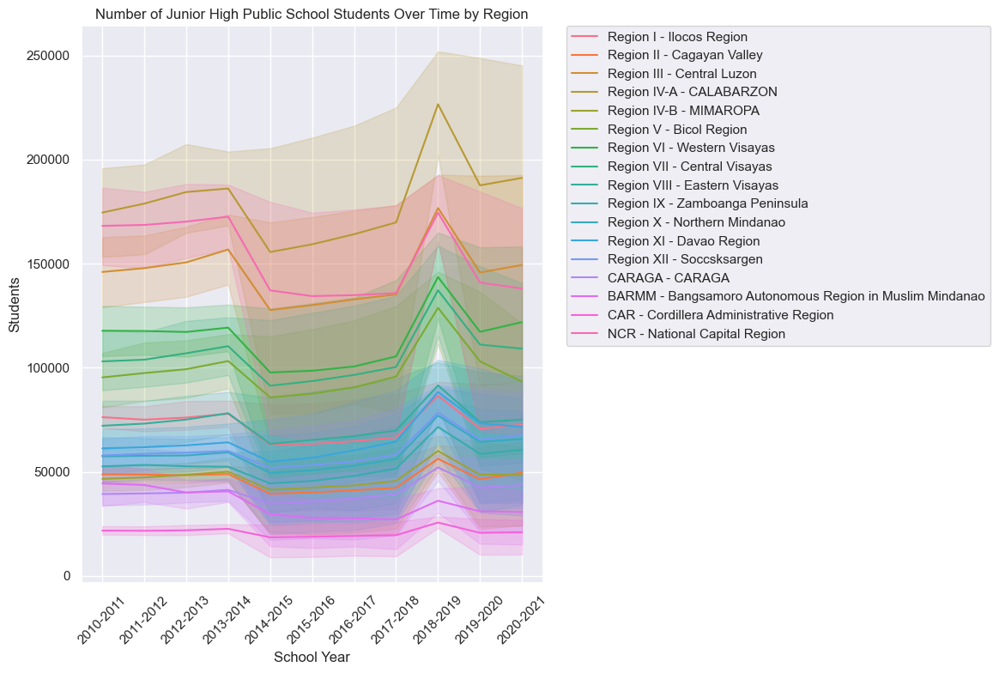

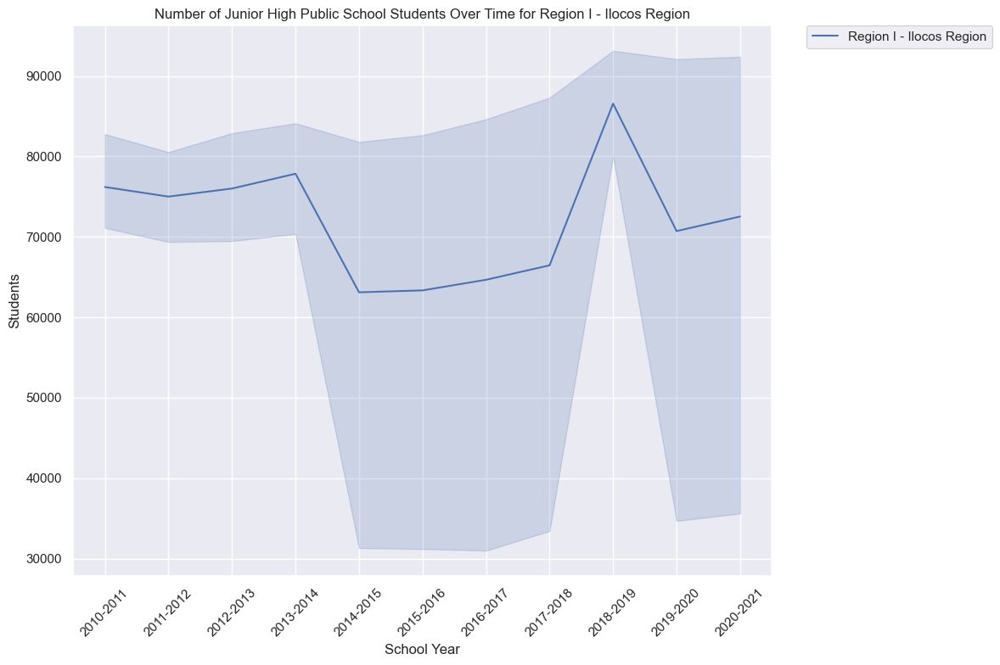

--- Region I - Ilocos Region ---


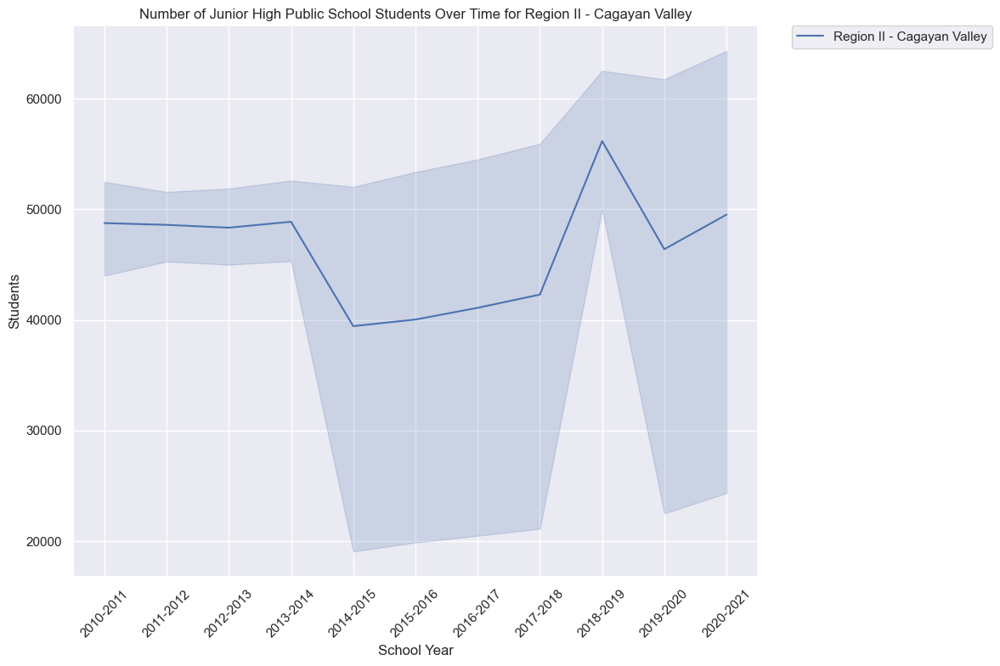

--- Region II - Cagayan Valley ---


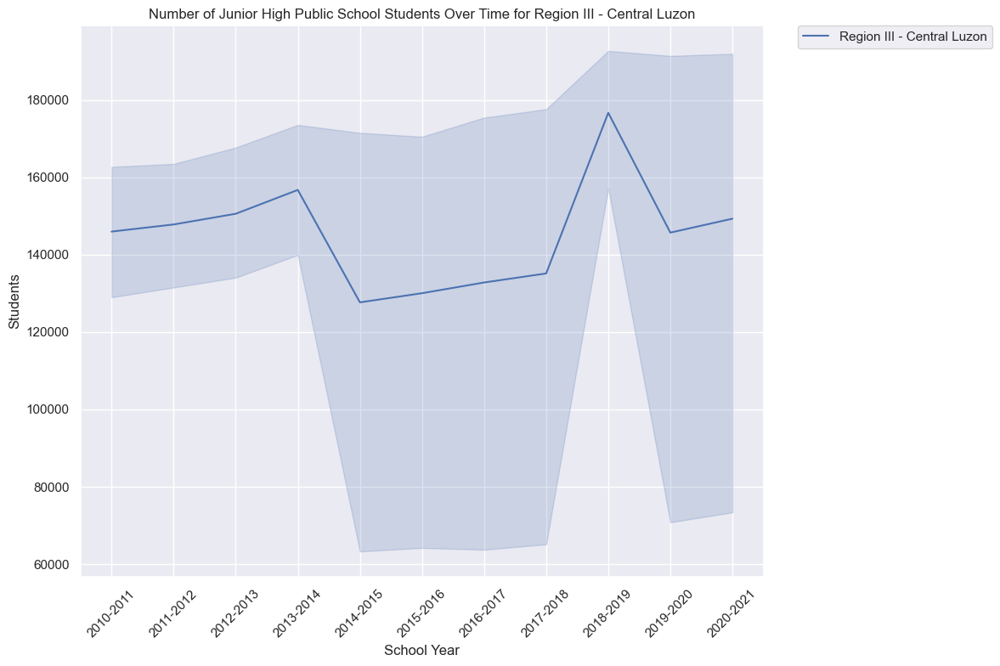

--- Region III - Central Luzon ---


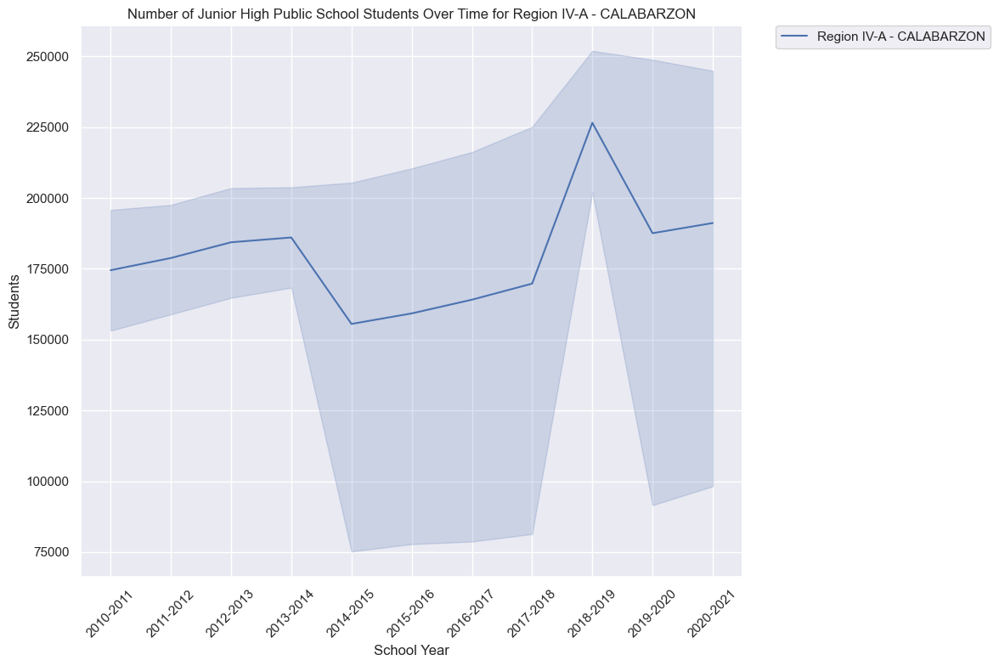

--- Region IV-A - CALABARZON ---


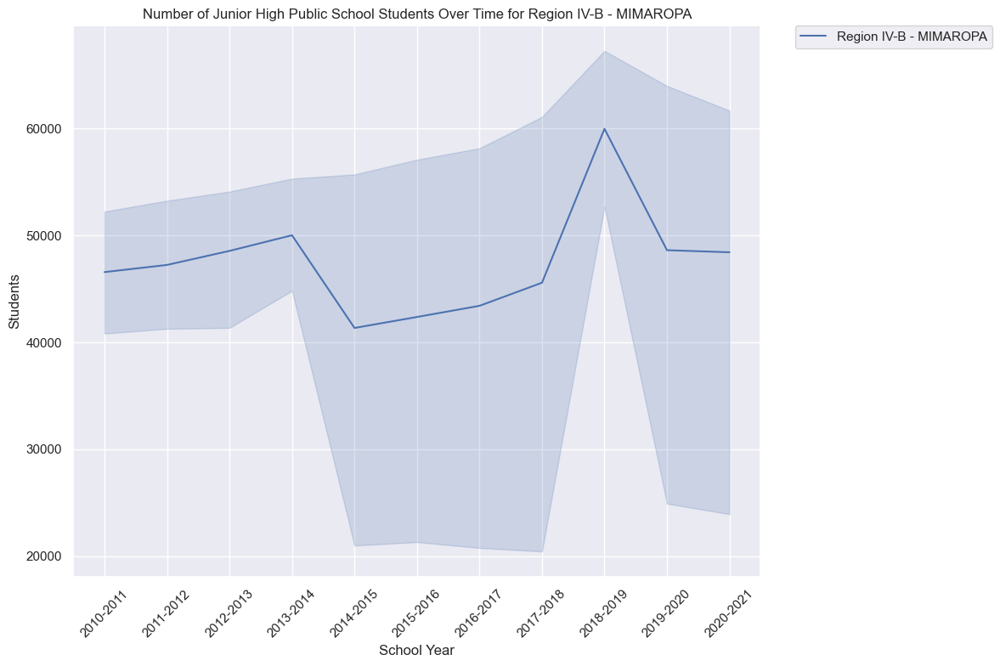

--- Region IV-B - MIMAROPA ---


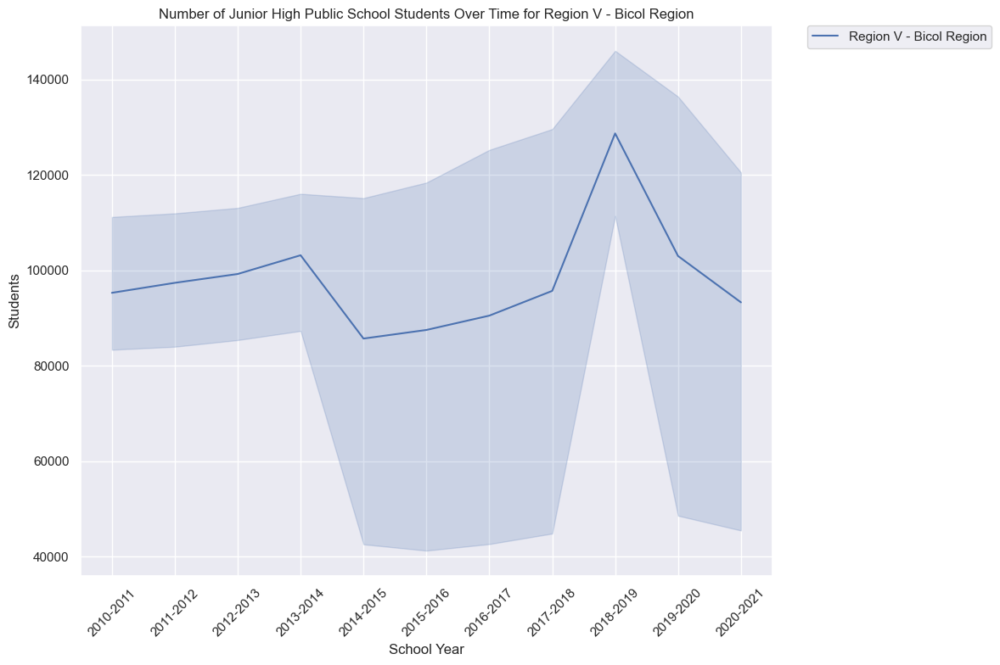

--- Region V - Bicol Region ---


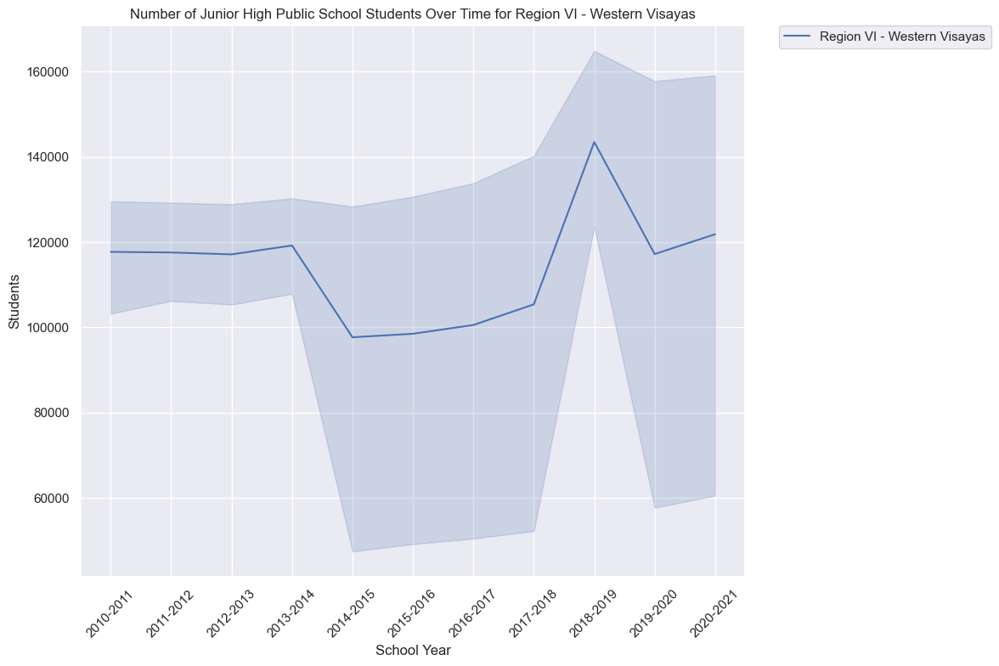

--- Region VI - Western Visayas ---


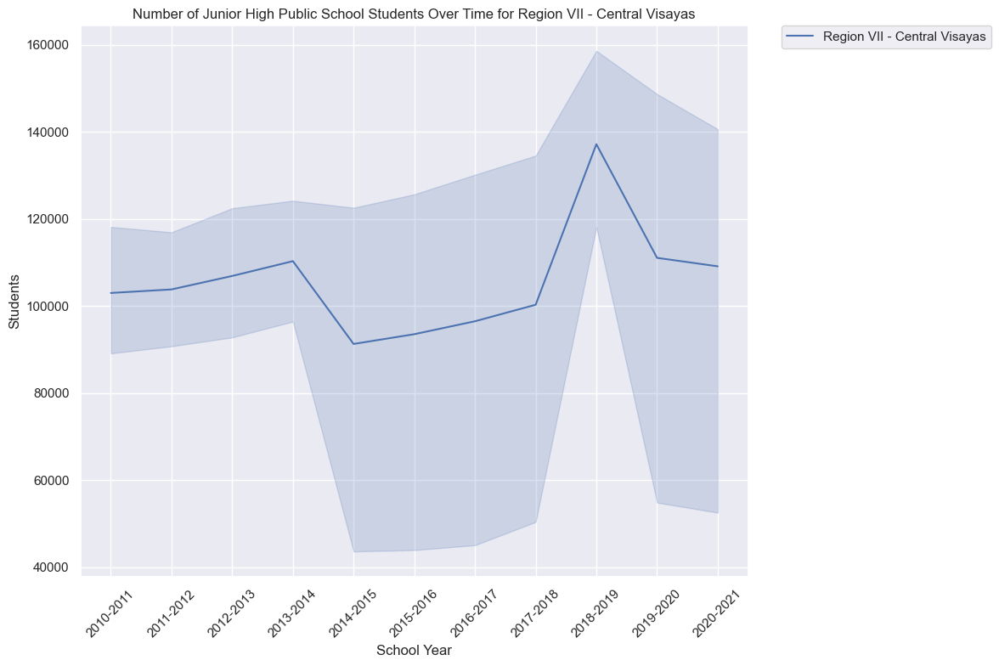

--- Region VII - Central Visayas ---


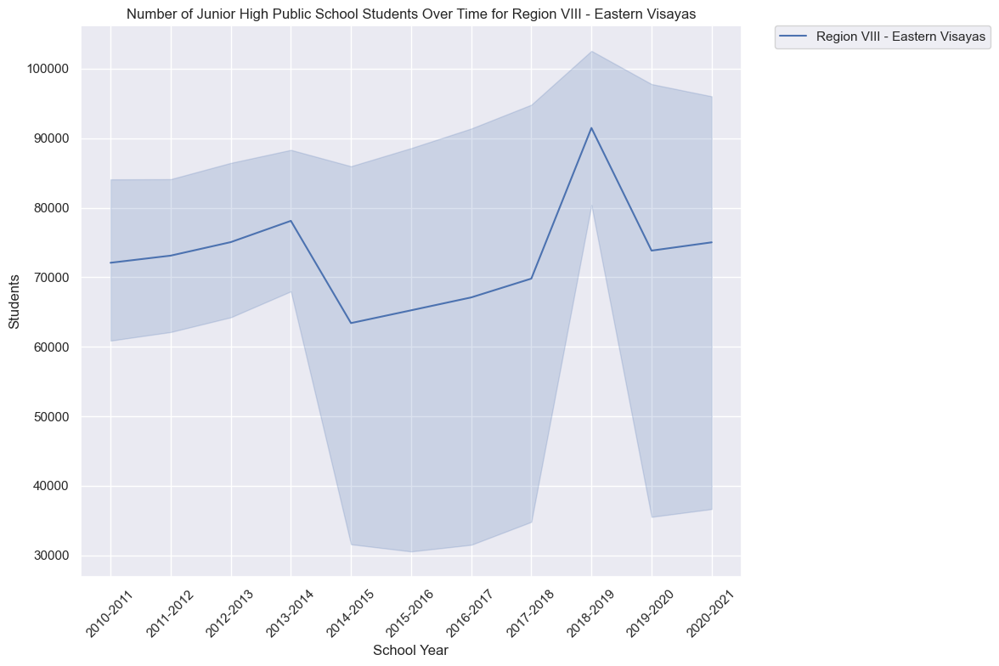

--- Region VIII - Eastern Visayas ---


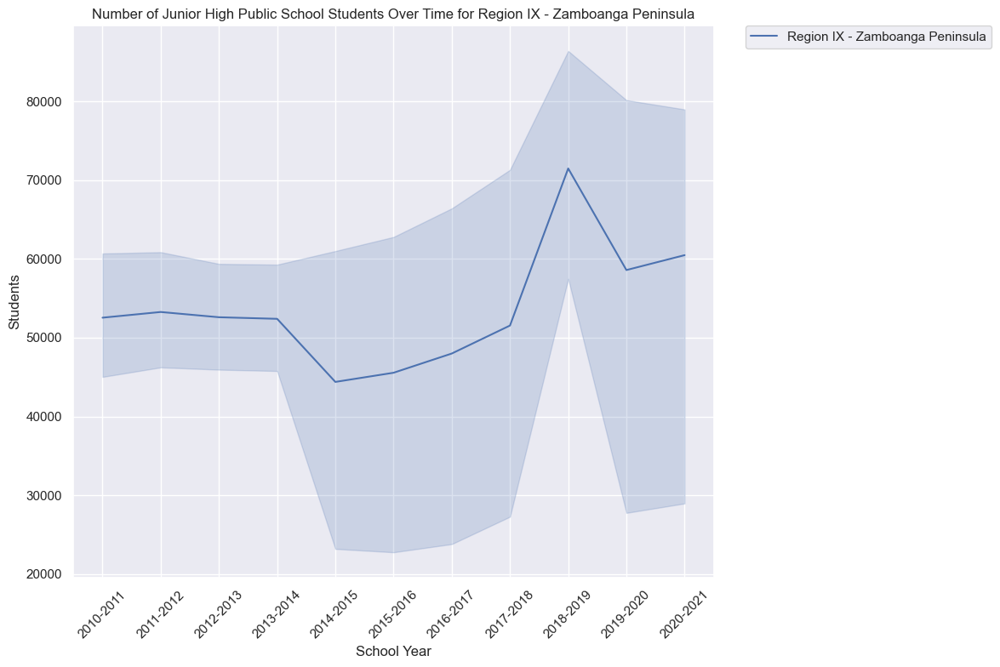

--- Region IX - Zamboanga Peninsula ---


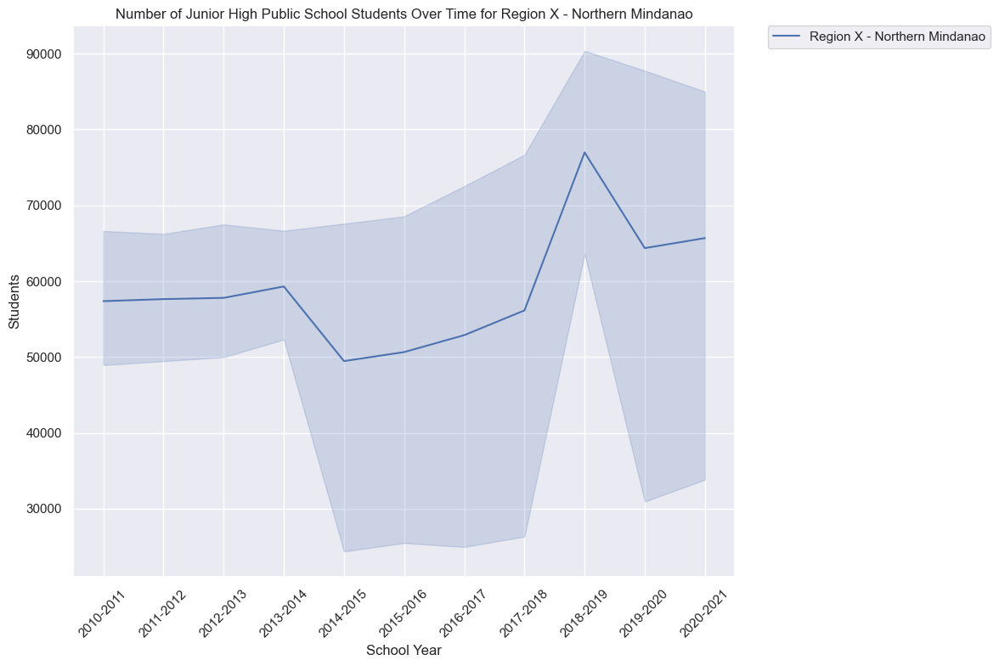

--- Region X - Northern Mindanao ---


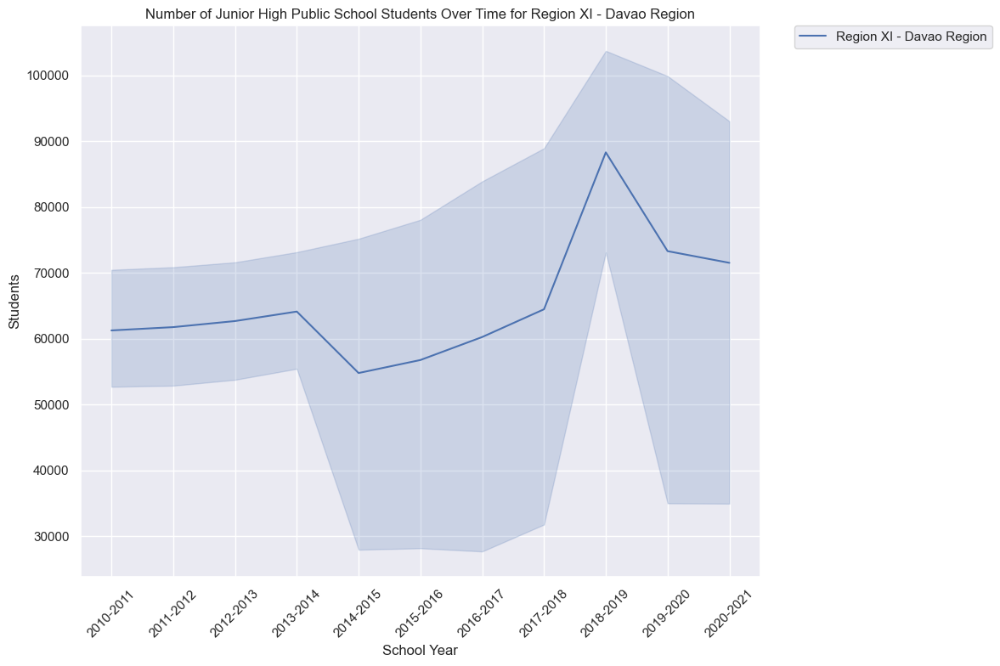

--- Region XI - Davao Region ---


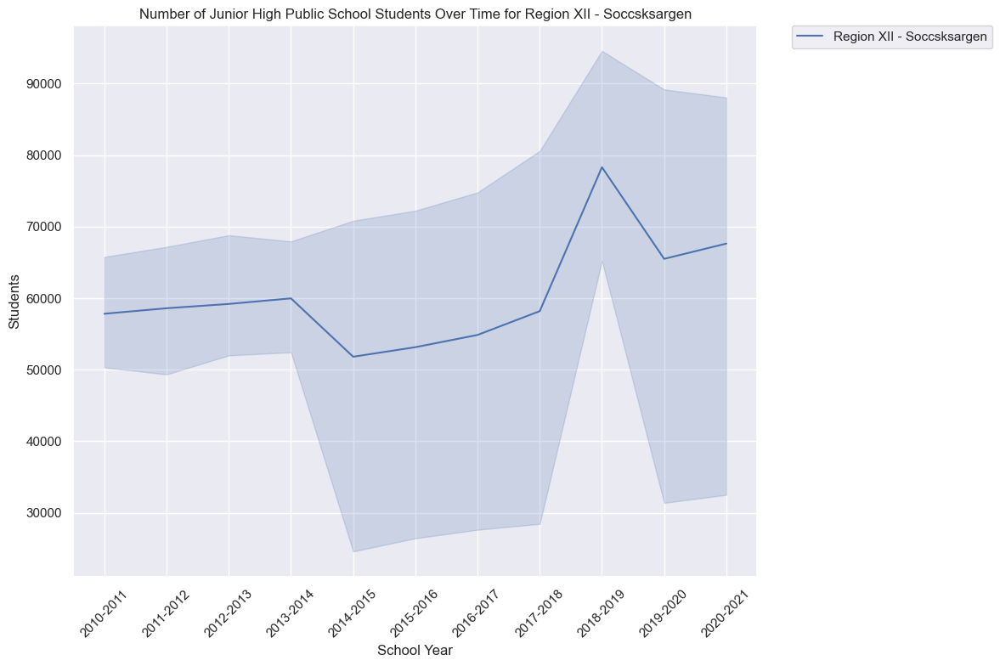

--- Region XII - Soccsksargen ---


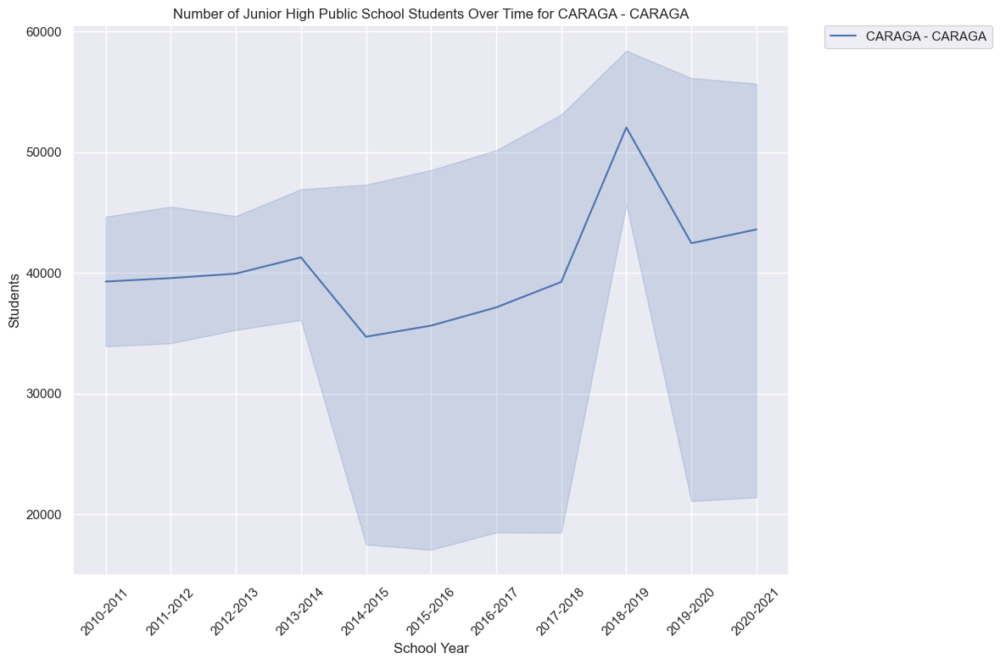

--- CARAGA - CARAGA ---


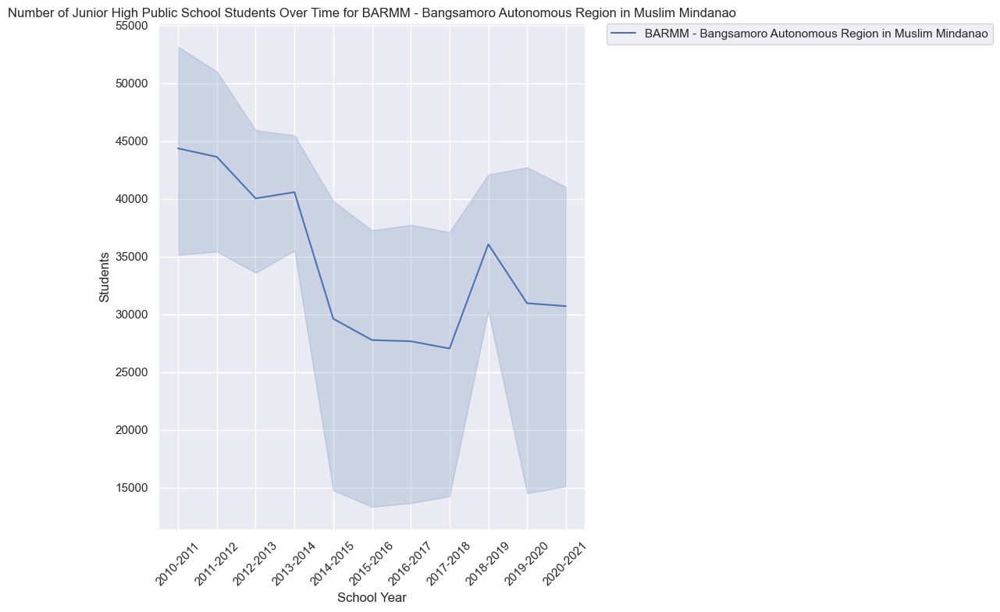

--- BARMM - Bangsamoro Autonomous Region in Muslim Mindanao ---


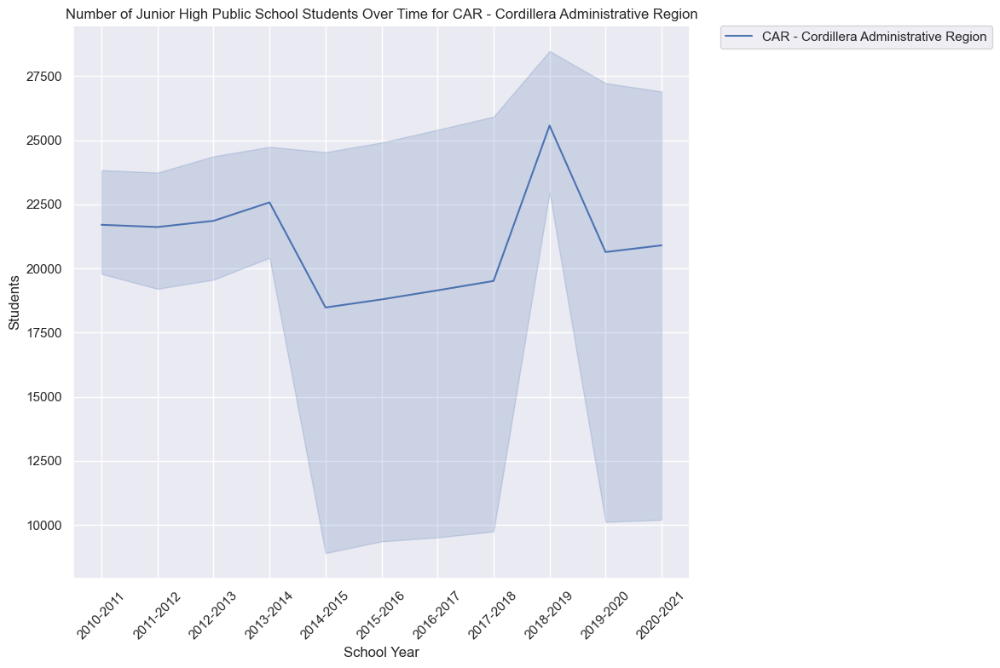

--- CAR - Cordillera Administrative Region ---


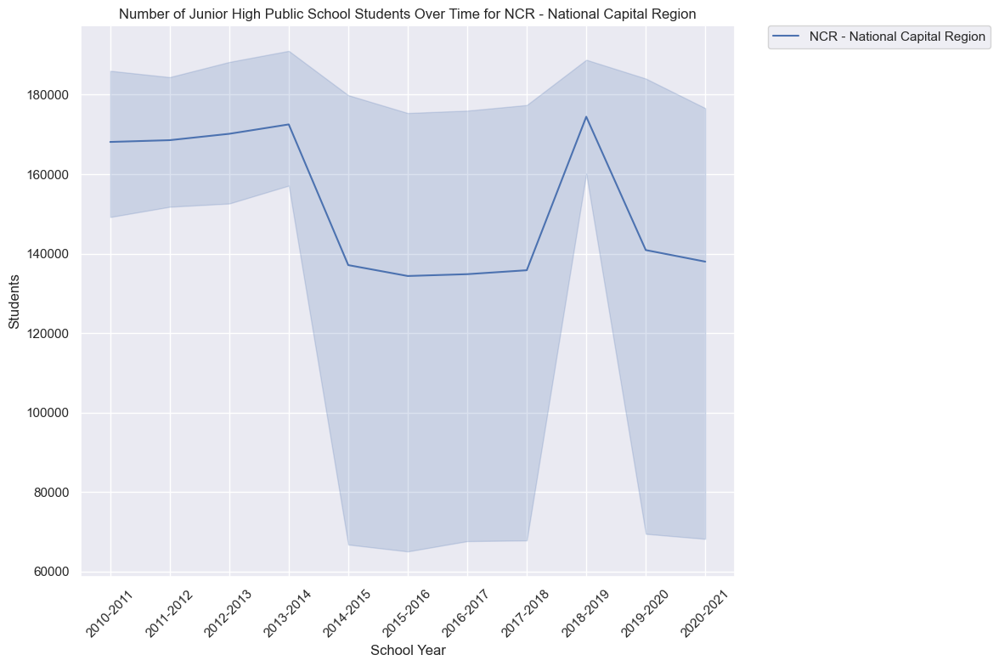

--- NCR - National Capital Region ---


In [56]:
def number_of_students_over_time_and_region(melted_df, region=None):
    sns.set_theme(style="darkgrid")

    # Ensure 'School Year' is treated as a categorical variable for better visualization
    melted_df['School Year'] = melted_df['School Year'].astype(str)
    
    # Create a figure
    plt.figure(figsize=(12, 8))
    
    if region:
        # Filter for specific region if provided
        filtered_df = melted_df[melted_df['Region'] == region]
        title_suffix = f" for {region}"
    else:
        # Use all regions
        filtered_df = melted_df
        title_suffix = " by Region"
    
    # Create the line plot
    sns.lineplot(
        x="School Year",
        y="Students",
        hue="Region",  # Use Region as the hue
        data=filtered_df
    )
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Add a title and adjust layout
    plt.title(f"Number of Junior High Public School Students Over Time{title_suffix}")
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    # Adjust layout to prevent clipping
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Call the function with all regions
number_of_students_over_time_and_region(melted_df)

# Alternatively, call it for each region
regions = melted_df['Region'].unique()
for region in regions:
    number_of_students_over_time_and_region(melted_df, region)
    print(f"--- {region} ---")

In [32]:
# Group by 'Level' and 'School Year' and calculate the total number of students
total_students_by_category_and_school_year = melted_df.groupby(['School Year'])['Students'].sum().reset_index()

# Rename columns for clarity
total_teachers_by_category_and_school_year.columns = ['School Category', 'Total Students', 'School Year']

# Display the result
print(total_students_by_category_and_school_year)

   School Year   Students
0    2010-2011  5530370.0
1    2011-2012  5576065.0
2    2012-2013  5641898.0
3    2013-2014  5772578.0
4    2014-2015  5928042.0
5    2015-2016  6012761.0
6    2016-2017  6177876.0
7    2017-2018  6412233.0
8    2018-2019  6840249.0
9    2019-2020  7004355.0
10   2020-2021  7043981.0


In [33]:
# Rename 'Grade Level' to 'Level' in melted_df to match df_teachers
melted_df.rename(columns={'Grade Level': 'Level'}, inplace=True)

In [34]:
# Filter df_teachers to include only "Junior High" level
junior_high_teachers = df_teachers[df_teachers['Level'] == 'Junior High School']

# Group teachers by 'School Year' and 'Region' and calculate the total number of teachers
teachers_by_year_region = junior_high_teachers.groupby(['School Year', 'Region'])['Teachers'].sum().reset_index()

# Group students by 'School Year' and 'Region' and calculate the total number of students
students_by_year_region = melted_df.groupby(['School Year', 'Region'])['Students'].sum().reset_index()

# Merge the two DataFrames on 'School Year' and 'Region'
ratio_df = pd.merge(teachers_by_year_region, students_by_year_region, on=['School Year', 'Region'], how='inner')

# Calculate the ratio of teachers to students
ratio_df['Student-to-Teacher Ratio'] = ratio_df['Students'] / ratio_df['Teachers']

# Display the resulting DataFrame
print(ratio_df)

    School Year                                             Region  Teachers  \
0     2010-2011  BARMM - Bangsamoro Autonomous Region in Muslim...    3332.0   
1     2010-2011             CAR - Cordillera Administrative Region    2967.0   
2     2010-2011                                    CARAGA - CARAGA    4271.0   
3     2010-2011                      NCR - National Capital Region   19210.0   
4     2010-2011                           Region I - Ilocos Region    9032.0   
..          ...                                                ...       ...   
182   2020-2021                       Region VII - Central Visayas   24145.0   
183   2020-2021                      Region VIII - Eastern Visayas   15841.0   
184   2020-2021                       Region X - Northern Mindanao   12888.0   
185   2020-2021                           Region XI - Davao Region   14773.0   
186   2020-2021                          Region XII - Soccsksargen   12774.0   

     Students  Student-to-Teacher Ratio

In [35]:
ratio_df['Student-to-Teacher Ratio'].describe()

count    187.000000
mean      28.689114
std        5.749012
min       20.249365
25%       24.928268
50%       26.782650
75%       31.028035
max       54.457553
Name: Student-to-Teacher Ratio, dtype: float64

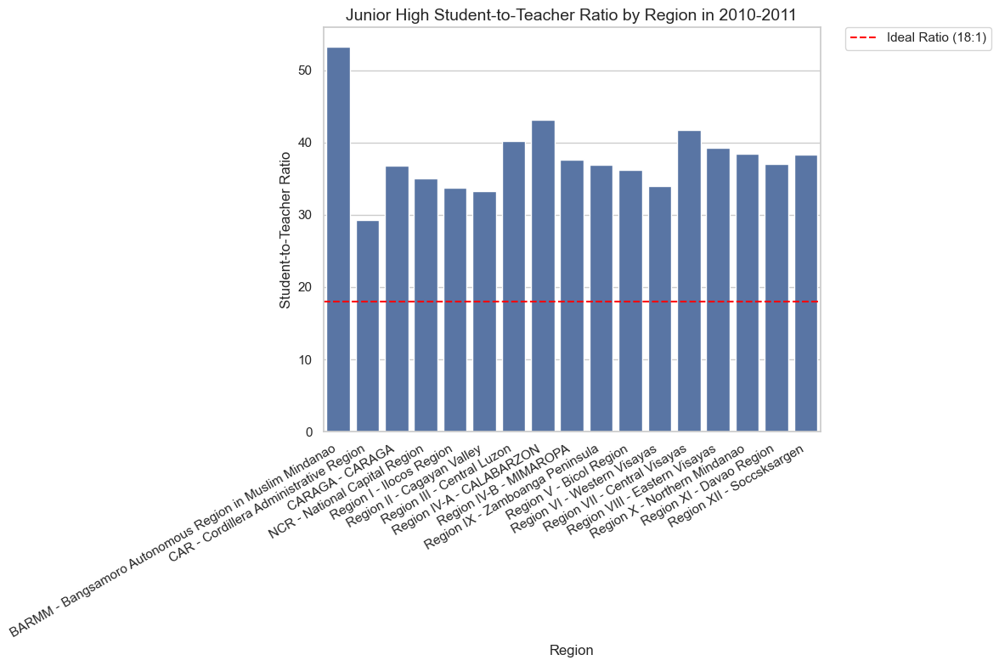

--- 2010-2011 ---


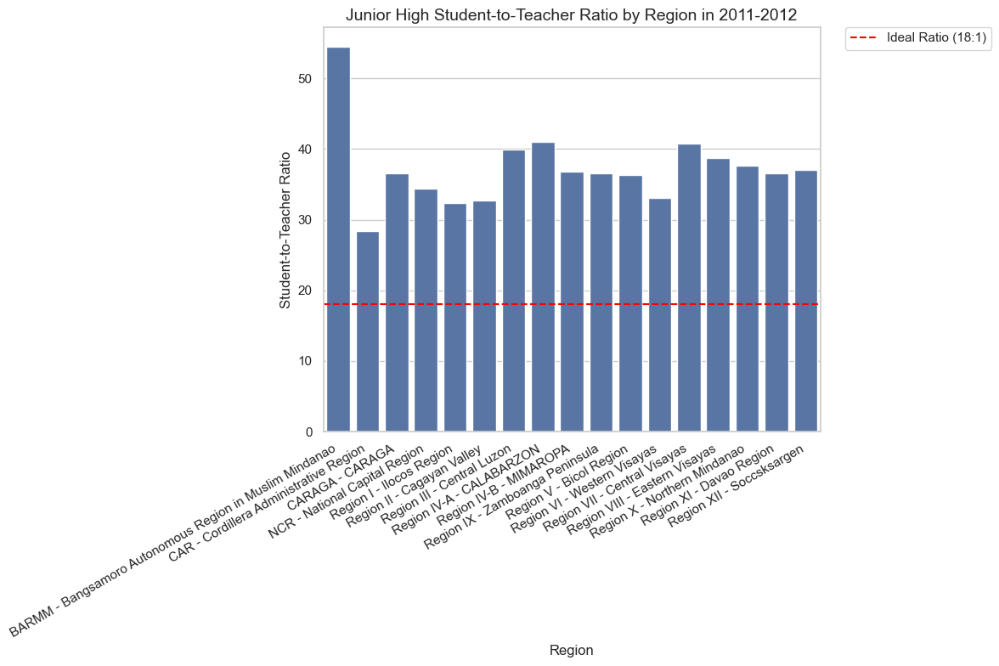

--- 2011-2012 ---


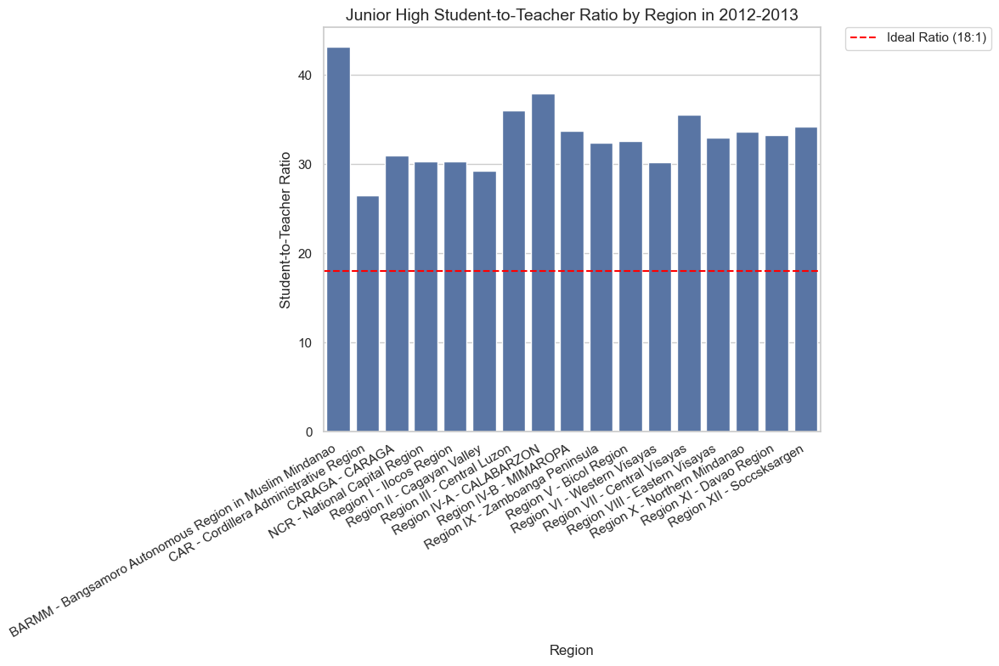

--- 2012-2013 ---


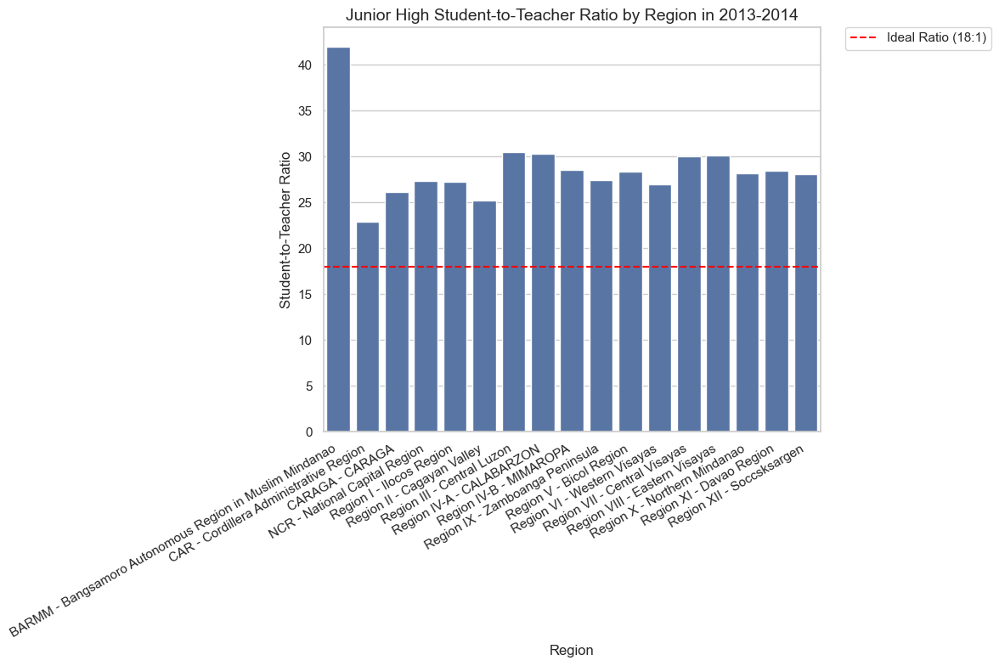

--- 2013-2014 ---


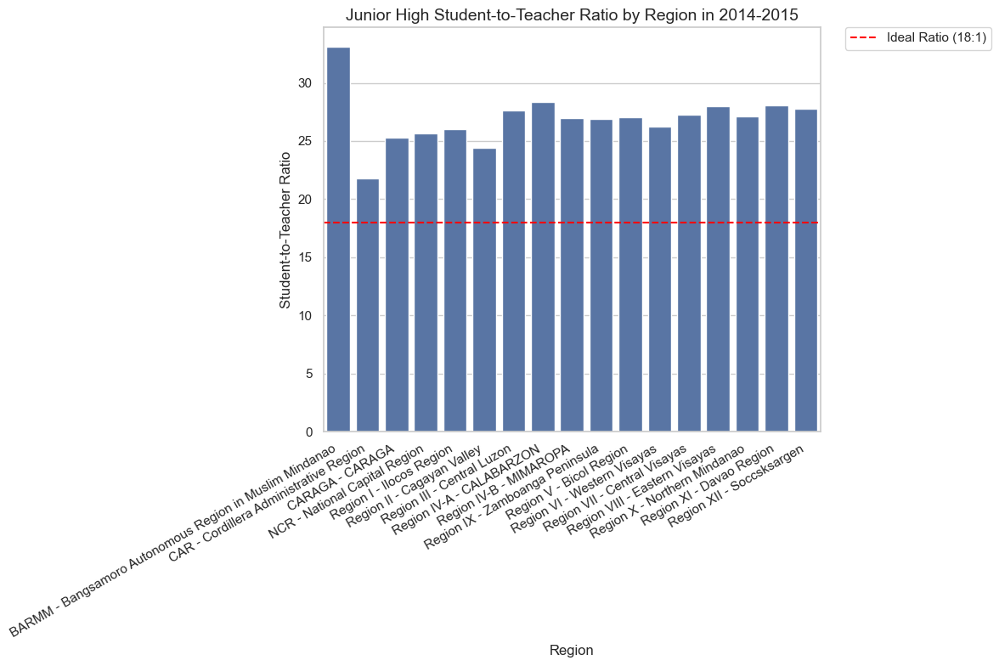

--- 2014-2015 ---


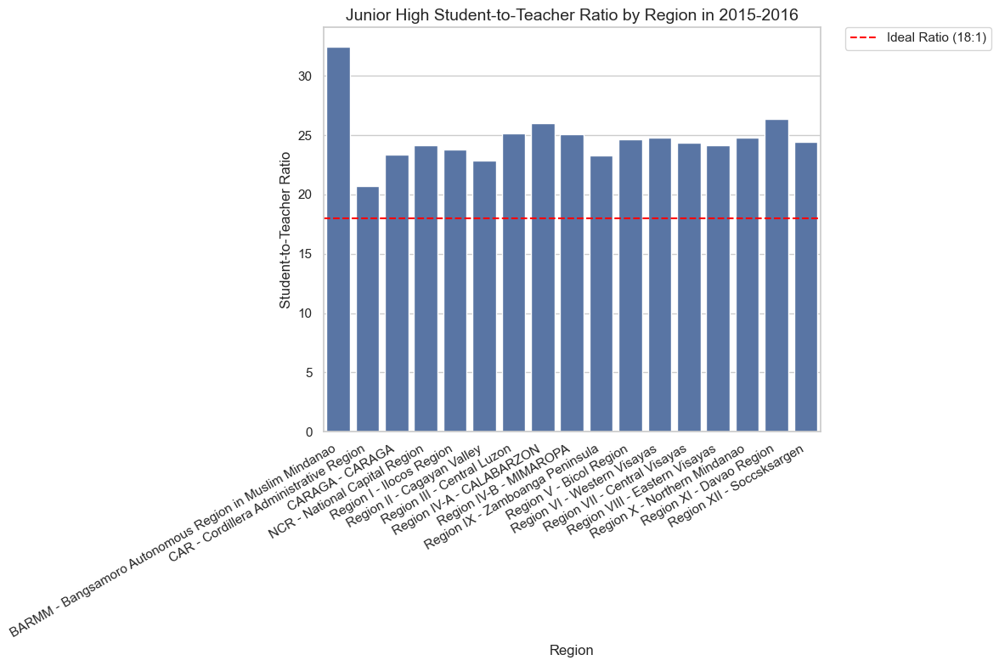

--- 2015-2016 ---


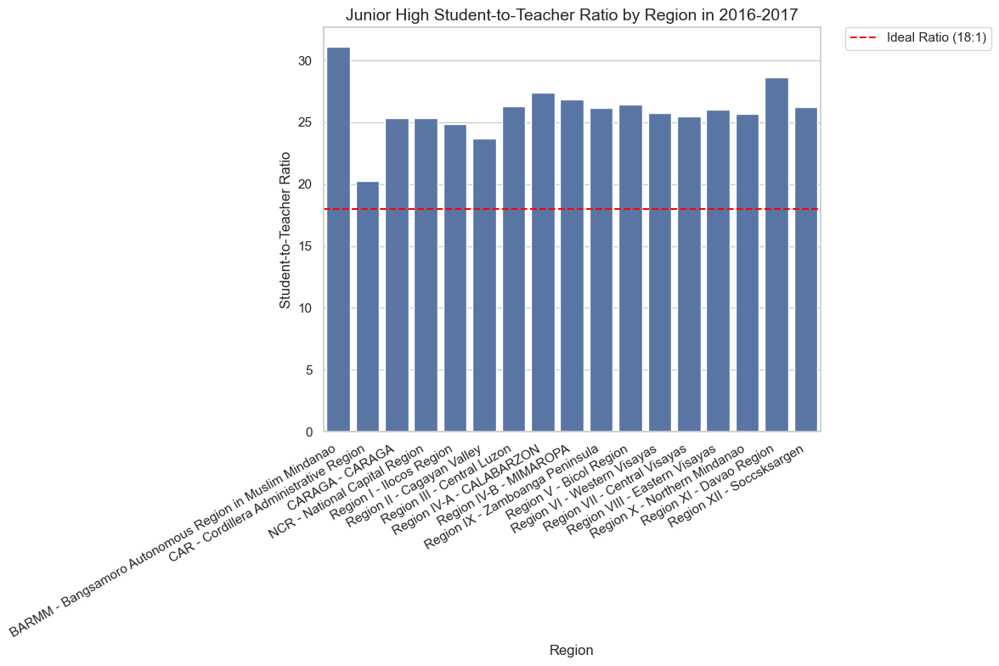

--- 2016-2017 ---


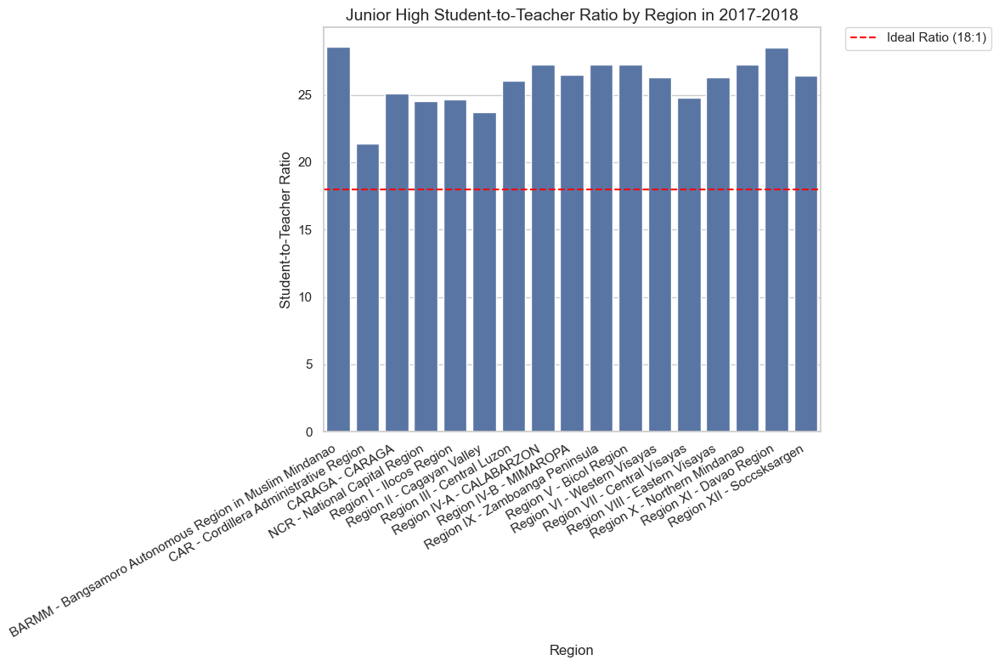

--- 2017-2018 ---


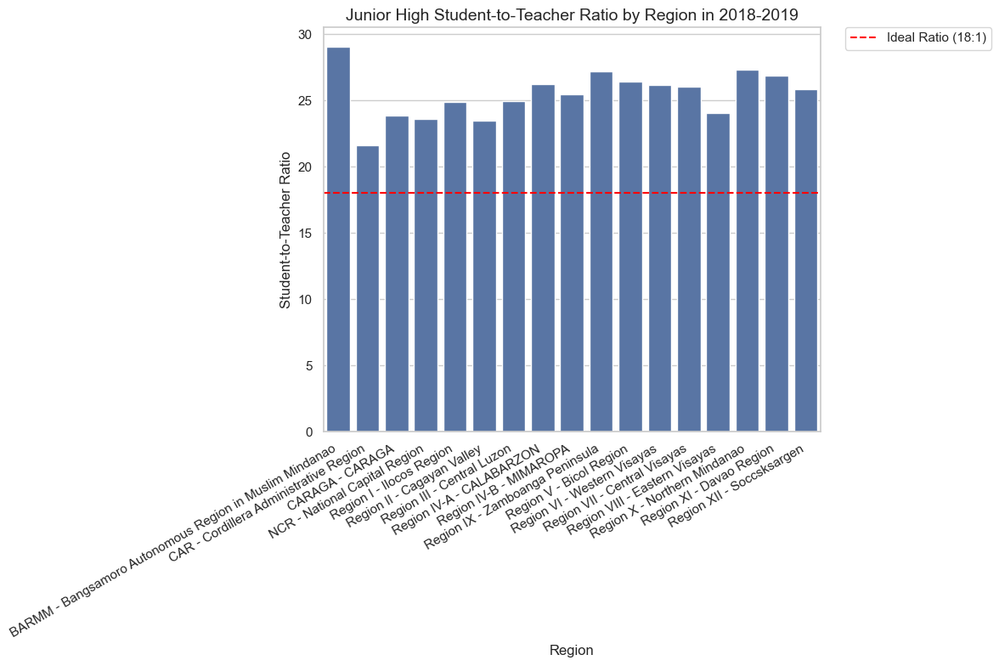

--- 2018-2019 ---


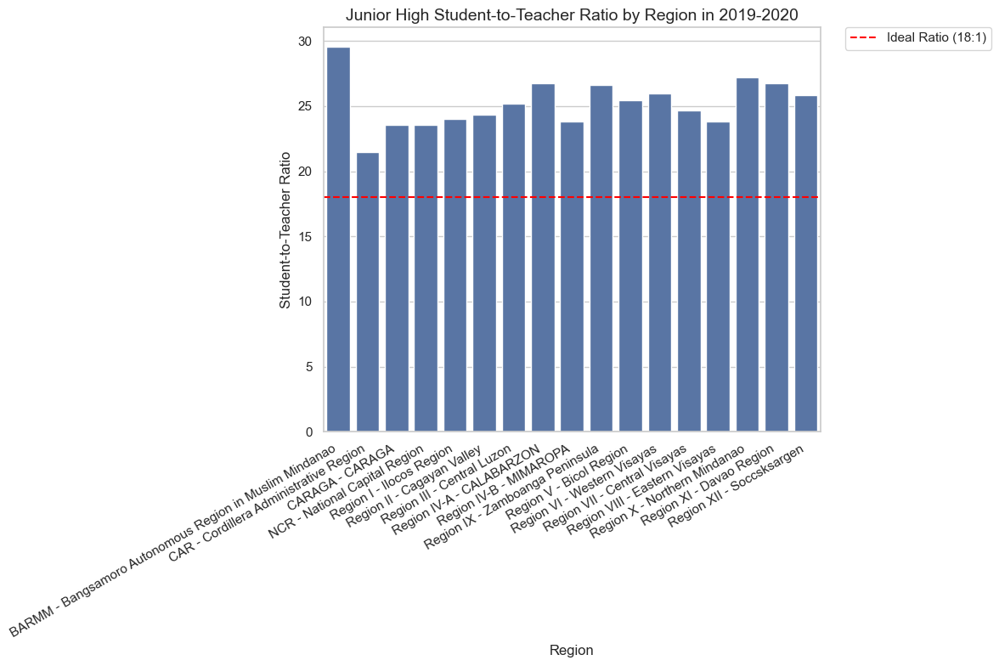

--- 2019-2020 ---


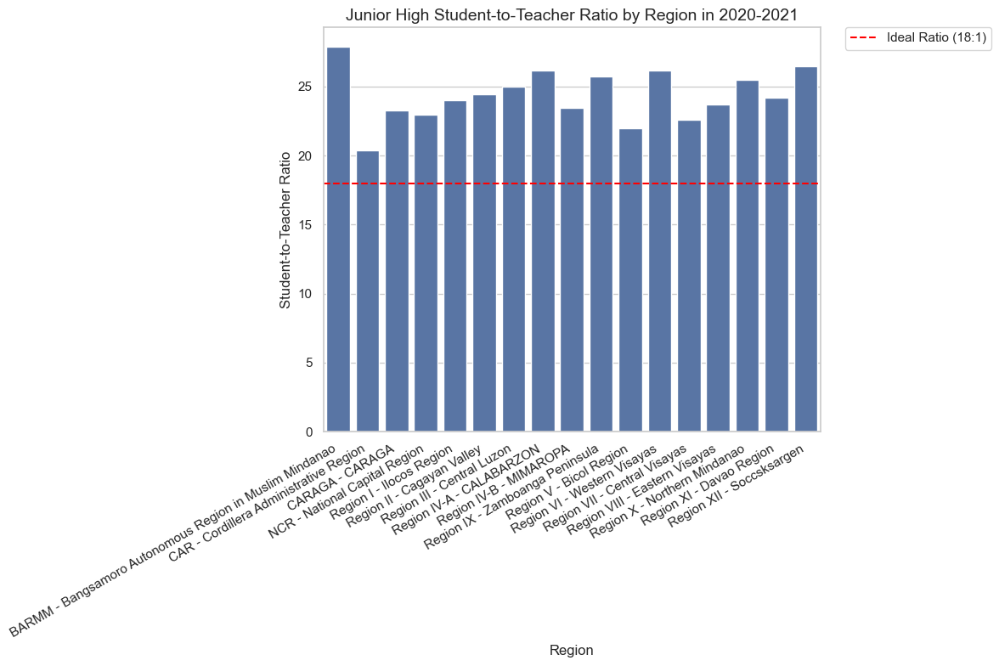

--- 2020-2021 ---


In [36]:
def filter_and_plot_ratio(ratio_df, school_year):
    # Filter the DataFrame for the given school year
    student_teacher = ratio_df[ratio_df['School Year'] == school_year]
    student_teacher = student_teacher[['Region', 'School Year', 'Student-to-Teacher Ratio']]

    sns.set_theme(style="whitegrid")

    plt.figure(figsize=(12, 8))  # Increased figure size for better spacing
    sns.barplot(data=student_teacher, x="Region", y="Student-to-Teacher Ratio", dodge=True)

    plt.axhline(y=18, color='red', linestyle='--', label="Ideal Ratio (18:1)")

    plt.title(f"Junior High Student-to-Teacher Ratio by Region in {school_year}", fontsize=14)
    plt.xlabel("Region", fontsize=12)
    plt.ylabel("Student-to-Teacher Ratio", fontsize=12)
    plt.xticks(rotation=30, ha='right')  # Rotated labels and aligned them to the right
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    plt.tight_layout()

    plt.show()

# Loop through the school years and call the function
for year in ['2010-2011', '2011-2012', '2012-2013', '2013-2014', '2014-2015', 
             '2015-2016', '2016-2017', '2017-2018', '2018-2019', '2019-2020', '2020-2021']:
    filter_and_plot_ratio(ratio_df, year)
    print(f"--- {year} ---")

## Senior High Public School Students

In [37]:
senior_high = pd.ExcelFile("C:/Users/franj/notebooks/public school teachers/senior high school.xlsx")

In [38]:
sheet_names = senior_high.sheet_names

In [39]:
df_list = []

# Loop through each sheet, sum male and female students per grade level
for sheet in sheet_names:
    # Read data from the sheet with multi-level headers
    df = pd.read_excel(senior_high, sheet_name=sheet, header=[0, 1])
    
    # Flatten the multi-level columns
    df.columns = [' '.join(col).strip() for col in df.columns]
    
    # Rename the "Region Unnamed: 0_level_1" column back to "Region"
    df.rename(columns={"Region Unnamed: 0_level_1": "Region"}, inplace=True)
    
    # Debug: Print the columns to verify
    print(f"Flattened columns for sheet '{sheet}': {df.columns}")
    
    # Ensure the 'Region' column exists
    if 'Region' not in df.columns:
        raise KeyError(f"'Region' column not found in sheet '{sheet}'")
    
    # Identify grade level columns dynamically
    grade_levels = set(col.rsplit(' ', 1)[0] for col in df.columns if "Male" in col or "Female" in col)
    
    # Debug: Print identified grade levels
    print(f"Identified grade levels for sheet '{sheet}': {grade_levels}")
    
    # Create a new DataFrame to store totals per grade level
    grade_totals = pd.DataFrame()
    grade_totals['Region'] = df['Region']  # Keep the "Region" column
    
    for grade in grade_levels:
        male_col = f"{grade} Male"
        female_col = f"{grade} Female"
        
        if male_col in df.columns and female_col in df.columns:
            # Sum "Male" and "Female" columns for the grade level
            grade_totals[grade] = df[male_col] + df[female_col]
    
    # Add a 'School Year' column to keep track of which year it came from
    grade_totals['School Year'] = sheet
    
    # Append the processed DataFrame to the list
    df_list.append(grade_totals)

# Concatenate all DataFrames together into one large DataFrame
combined_df = pd.concat(df_list, ignore_index=True)

# Export to CSV
# combined_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_senior_high.csv", index=False)

# Preview the combined DataFrame
print(combined_df)

Flattened columns for sheet '2016-2017': Index(['Region', 'Grade 11 (ABM) Male', 'Grade 11 (ABM) Female',
       'Grade 11 (HUMSS) Male', 'Grade 11 (HUMSS) Female',
       'Grade 11 (STEM) Male', 'Grade 11 (STEM) Female', 'Grade 11 (GAS) Male',
       'Grade 11 (GAS) Female', 'Grade 11 (MARITIME) Male',
       'Grade 11 (MARITIME) Female', 'Grade 11 (TVL) Male',
       'Grade 11 (TVL) Female', 'Grade 11 (SPORTs) Male',
       'Grade 11 (SPORTs) Female', 'Grade 11 (ARTs & DESIGN) Male',
       'Grade 11 (ARTs & DESIGN) Female'],
      dtype='object')
Identified grade levels for sheet '2016-2017': {'Grade 11 (GAS)', 'Grade 11 (SPORTs)', 'Grade 11 (ARTs & DESIGN)', 'Grade 11 (ABM)', 'Grade 11 (HUMSS)', 'Grade 11 (TVL)', 'Grade 11 (MARITIME)', 'Grade 11 (STEM)'}
Flattened columns for sheet '2017-2018': Index(['Region', 'Grade 11 (ABM) Male', 'Grade 11 (ABM) Female',
       'Grade 11 (HUMSS) Male', 'Grade 11 (HUMSS) Female',
       'Grade 11 (STEM) Male', 'Grade 11 (STEM) Female', 'Grade 11

In [40]:
combined_df.columns

Index(['Region', 'Grade 11 (GAS)', 'Grade 11 (SPORTs)',
       'Grade 11 (ARTs & DESIGN)', 'Grade 11 (ABM)', 'Grade 11 (HUMSS)',
       'Grade 11 (TVL)', 'Grade 11 (MARITIME)', 'Grade 11 (STEM)',
       'School Year', 'Grade 12 (GAS)', 'Grade 12 (SPORTs)', 'Grade 12 (ABM)',
       'Grade 12 (MARITIME)', 'Grade 12 (STEM)', 'Grade 12 (ARTs & DESIGN)',
       'Grade 12 (HUMSS)', 'Grade 12 (TVL)'],
      dtype='object')

In [41]:
combined_df = combined_df[['Region', "Grade 11 (TVL)", "Grade 11 (GAS)", "Grade 11 (STEM)", "Grade 11 (MARITIME)", "Grade 11 (ARTs & DESIGN)", "Grade 11 (SPORTs)", "Grade 11 (HUMSS)",	"Grade 11 (ABM)", "Grade 12 (SPORTs)", "Grade 12 (GAS)", "Grade 12 (STEM)", "Grade 12 (TVL)", "Grade 12 (HUMSS)", "Grade 12 (MARITIME)", "Grade 12 (ABM)", "Grade 12 (ARTs & DESIGN)", "School Year"]]

print(combined_df)

                                               Region  Grade 11 (TVL)  \
0                            Region I - Ilocos Region           24406   
1                          Region II - Cagayan Valley           11284   
2                          Region III - Central Luzon           36297   
3                            Region IV-A - CALABARZON           36577   
4                              Region IV-B - MIMAROPA           12602   
..                                                ...             ...   
80                          Region XII - Soccsksargen           20380   
81                                    CARAGA - CARAGA           14968   
82  BARMM - Bangsamoro Autonomous Region in Muslim...            6907   
83             CAR - Cordillera Administrative Region            5650   
84                      NCR - National Capital Region           21699   

    Grade 11 (GAS)  Grade 11 (STEM)  Grade 11 (MARITIME)  \
0            14881             4624                    0   
1  

In [42]:
melted_df = pd.melt(
    combined_df,
    id_vars=["Region", "School Year"],
    value_vars=["Grade 11 (TVL)", "Grade 11 (GAS)", "Grade 11 (STEM)", "Grade 11 (MARITIME)", "Grade 11 (ARTs & DESIGN)", "Grade 11 (SPORTs)", "Grade 11 (HUMSS)",	"Grade 11 (ABM)", "Grade 12 (SPORTs)", "Grade 12 (GAS)", "Grade 12 (STEM)", "Grade 12 (TVL)", "Grade 12 (HUMSS)", "Grade 12 (MARITIME)", "Grade 12 (ABM)", "Grade 12 (ARTs & DESIGN)"],
    var_name="Grade Level",
    value_name="Students"
)

melted_df

,Region,School Year,Grade Level,Students
0,Region I - Ilocos Region,2016-2017,Grade 11 (TVL),24406.0
1,Region II - Cagayan Valley,2016-2017,Grade 11 (TVL),11284.0
2,Region III - Central Luzon,2016-2017,Grade 11 (TVL),36297.0
3,Region IV-A - CALABARZON,2016-2017,Grade 11 (TVL),36577.0
4,Region IV-B - MIMAROPA,2016-2017,Grade 11 (TVL),12602.0
...,...,...,...,...
1355,Region XII - Soccsksargen,2020-2021,Grade 12 (ARTs & DESIGN),217.0
1356,CARAGA - CARAGA,2020-2021,Grade 12 (ARTs & DESIGN),158.0
1357,BARMM - Bangsamoro Autonomous Region in Muslim...,2020-2021,Grade 12 (ARTs & DESIGN),52.0
1358,CAR - Cordillera Administrative Region,2020-2021,Grade 12 (ARTs & DESIGN),38.0


In [43]:
melted_df.dropna(inplace=True)

In [44]:
# melted_df.to_csv("C:/Users/franj/notebooks/public school teachers/combined_senior_high.csv", index=False)

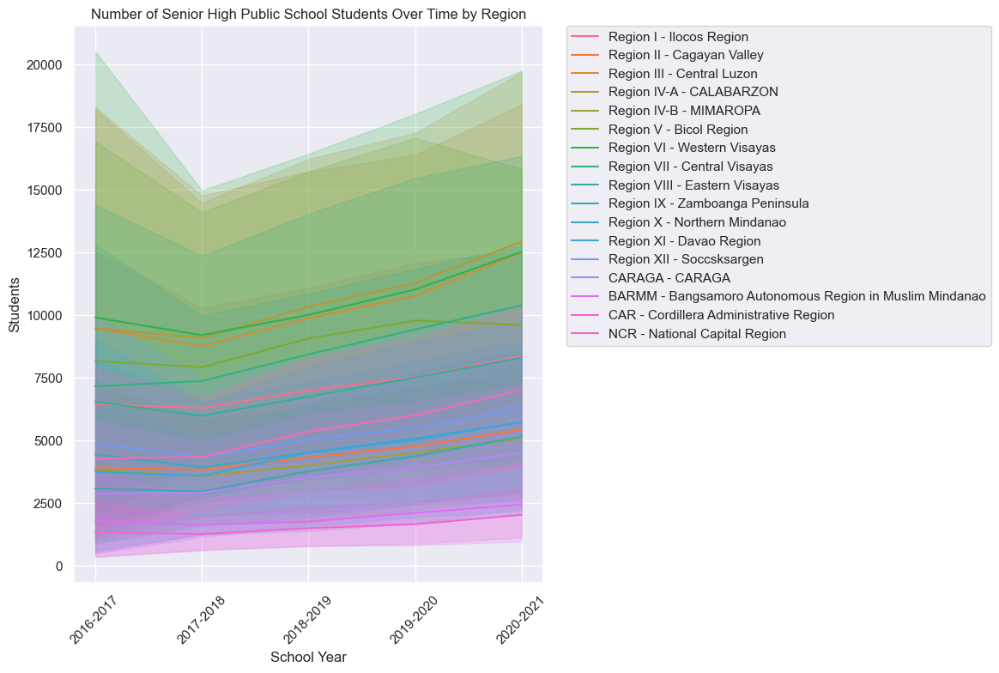

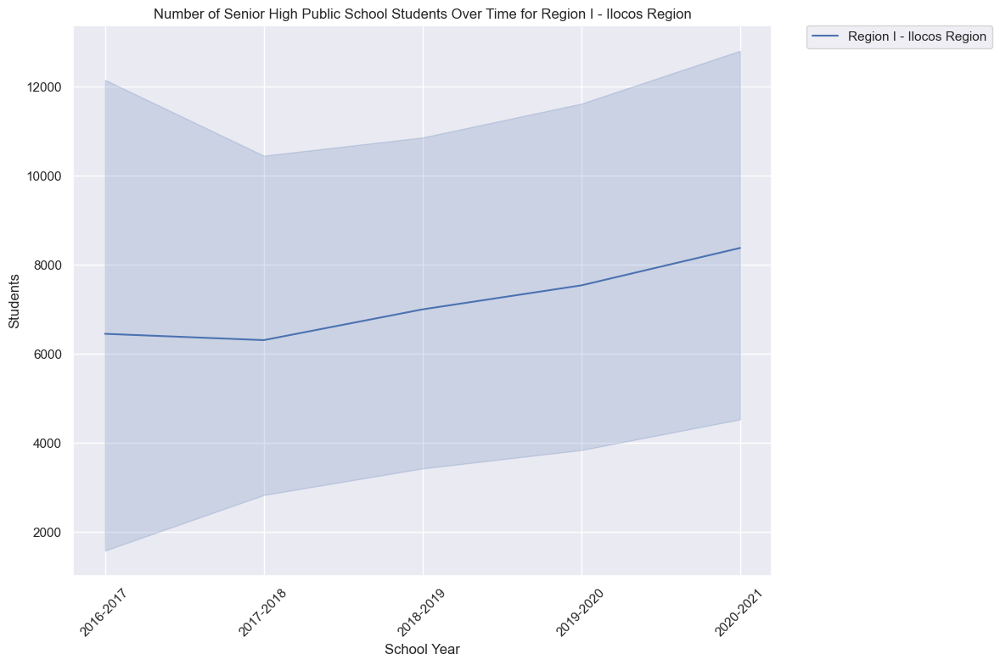

--- Region I - Ilocos Region ---


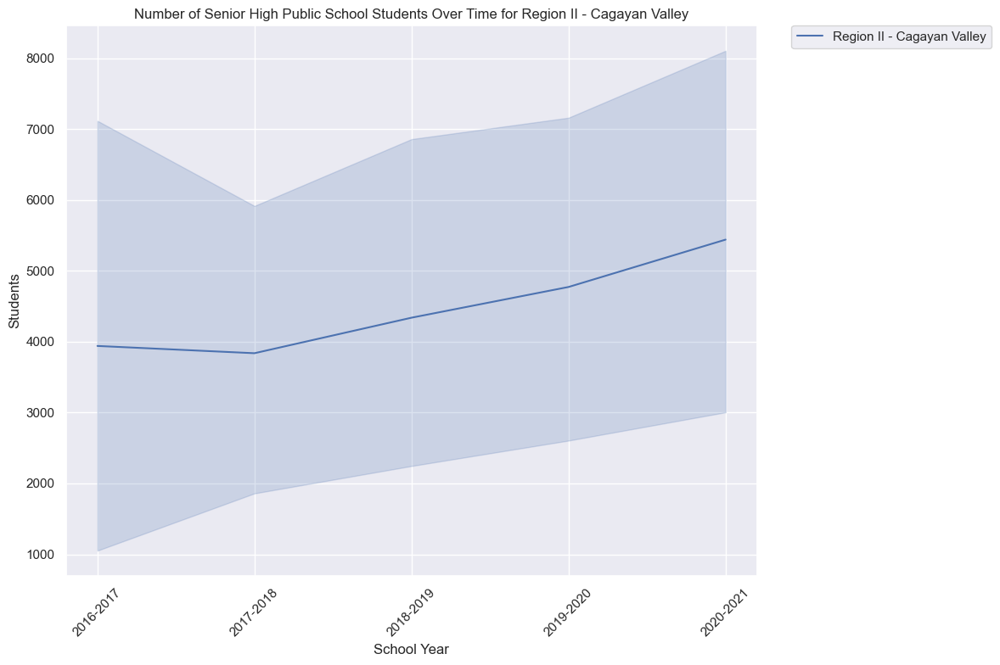

--- Region II - Cagayan Valley ---


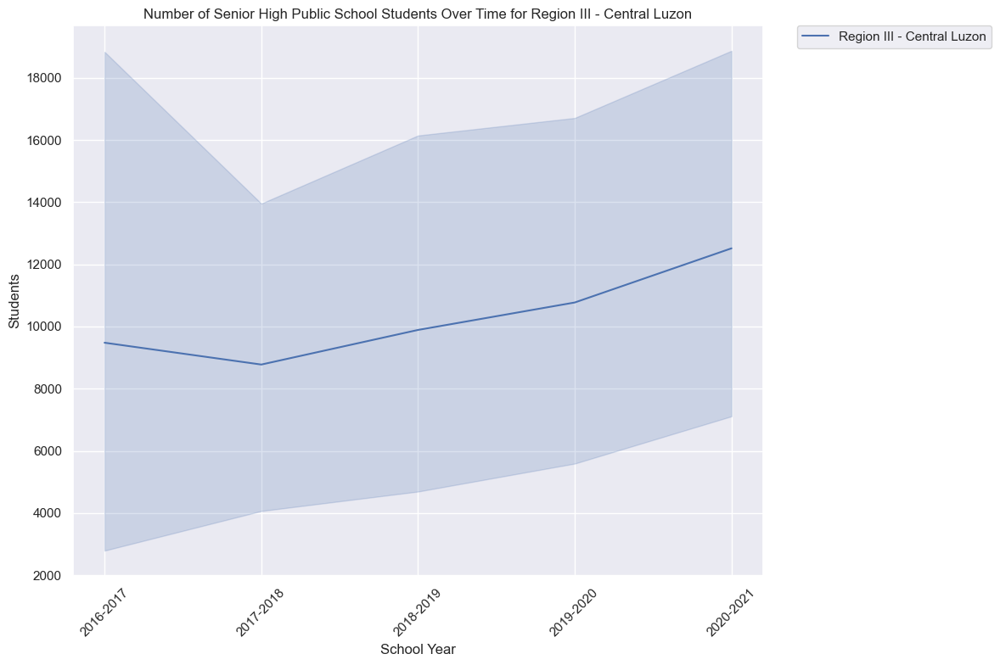

--- Region III - Central Luzon ---


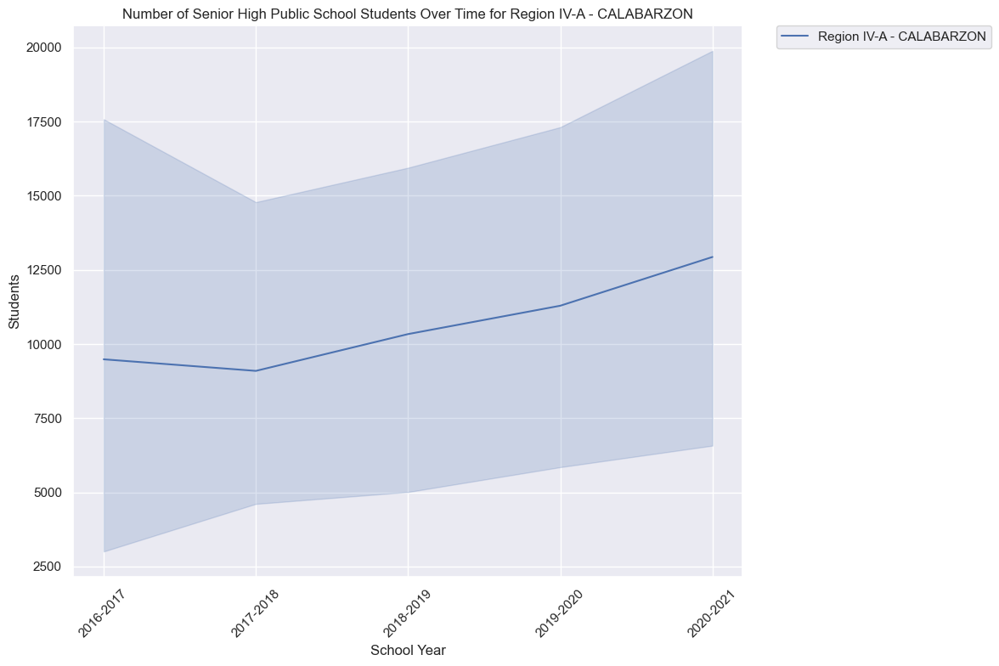

--- Region IV-A - CALABARZON ---


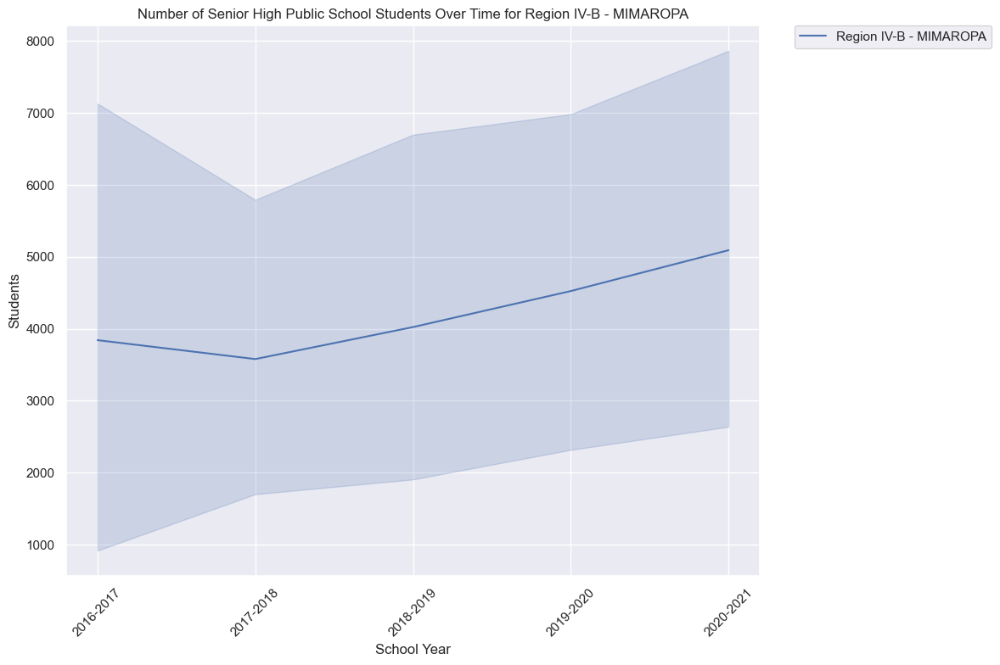

--- Region IV-B - MIMAROPA ---


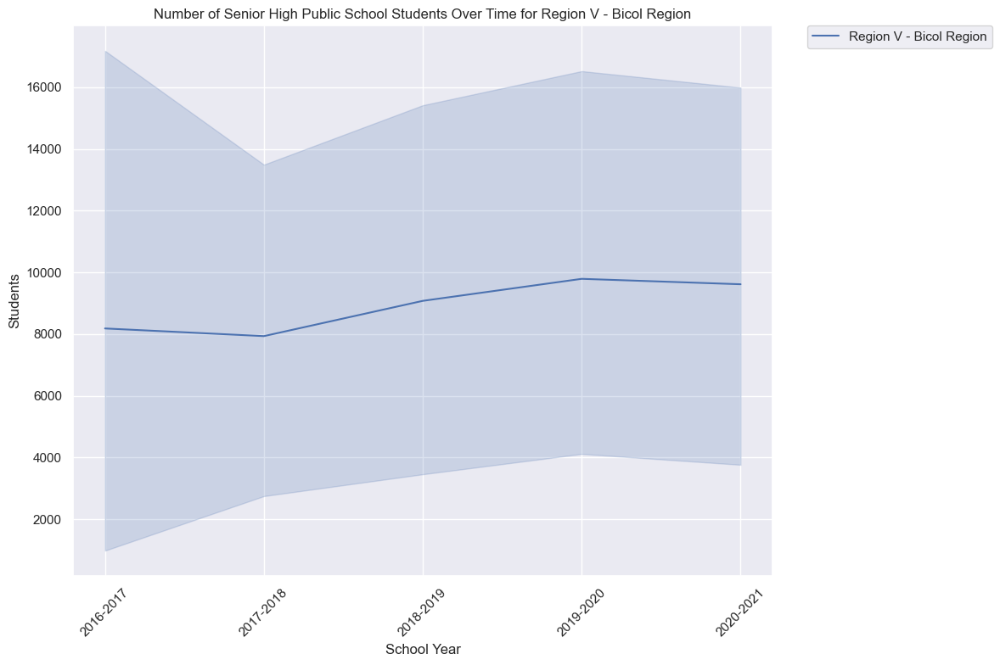

--- Region V - Bicol Region ---


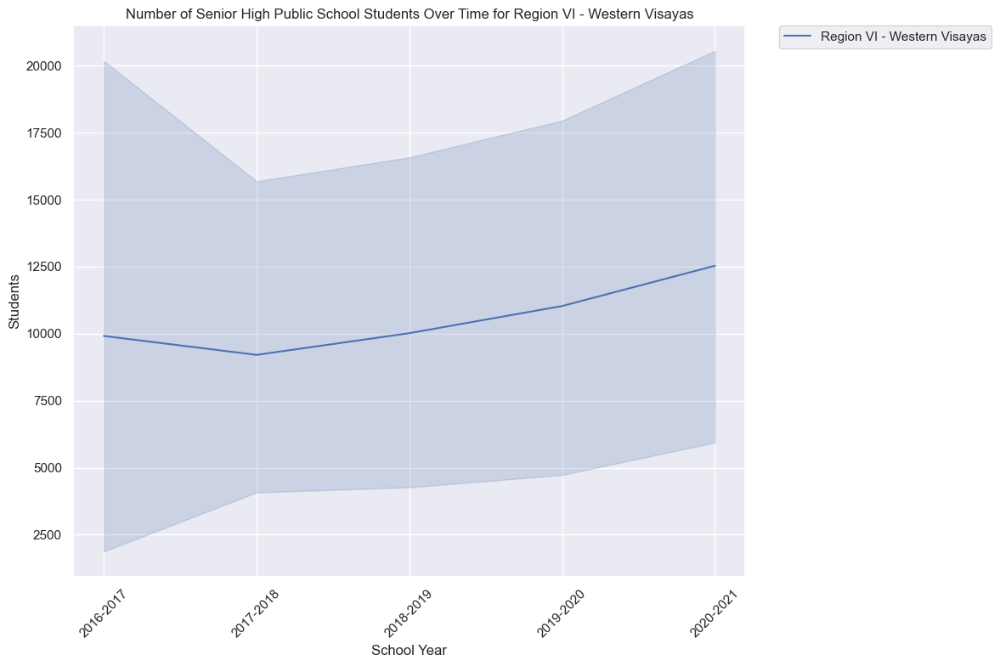

--- Region VI - Western Visayas ---


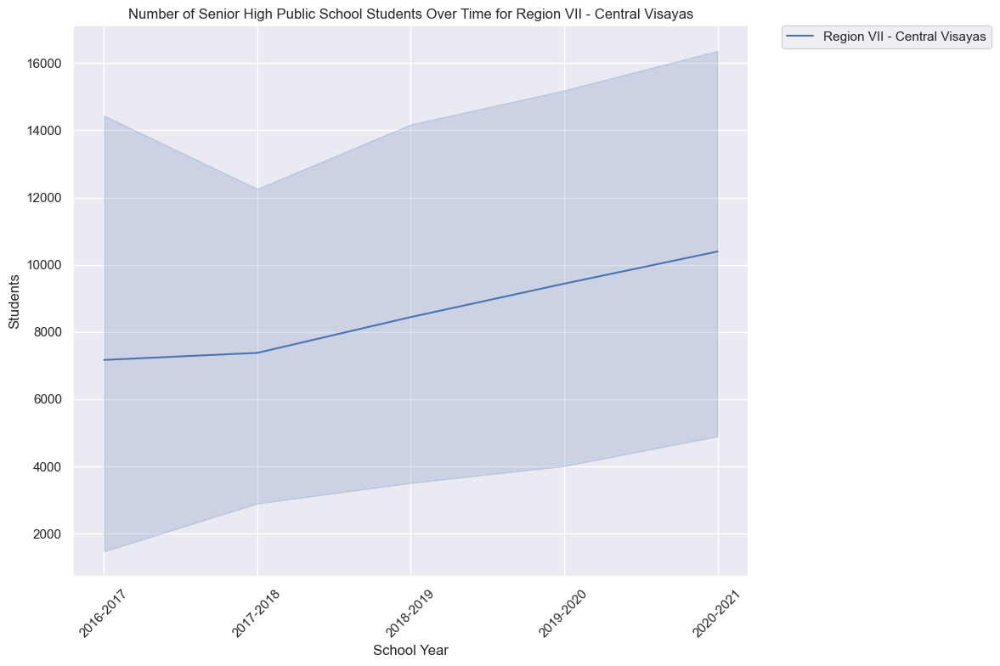

--- Region VII - Central Visayas ---


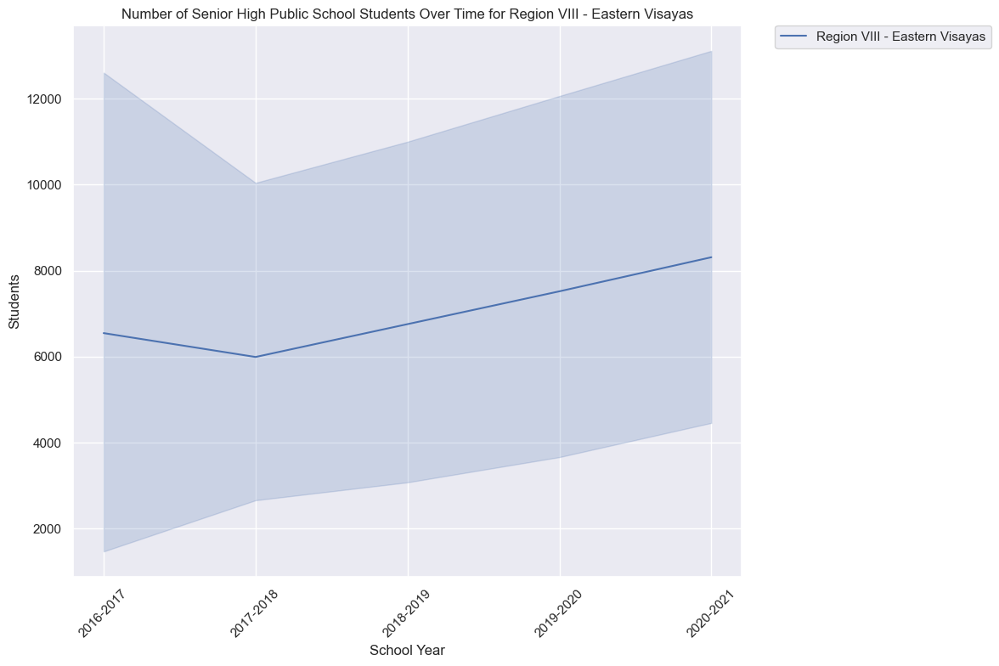

--- Region VIII - Eastern Visayas ---


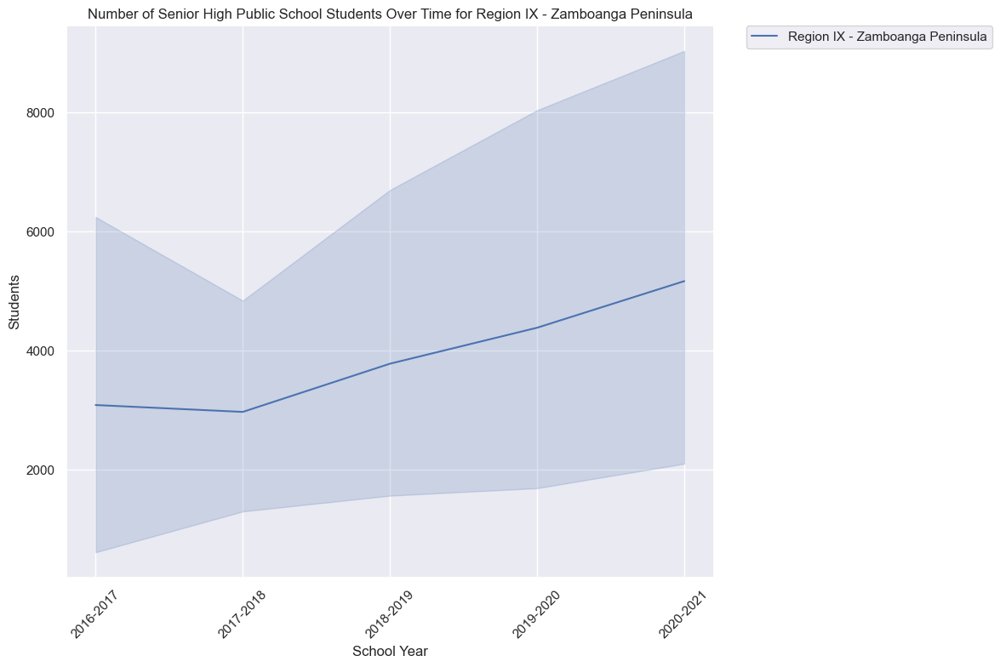

--- Region IX - Zamboanga Peninsula ---


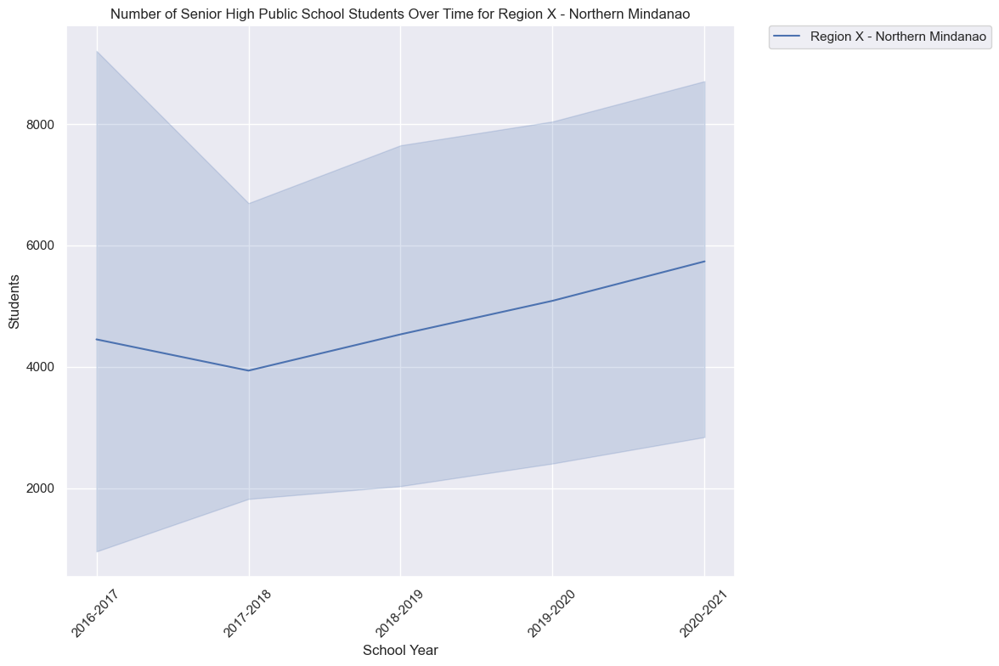

--- Region X - Northern Mindanao ---


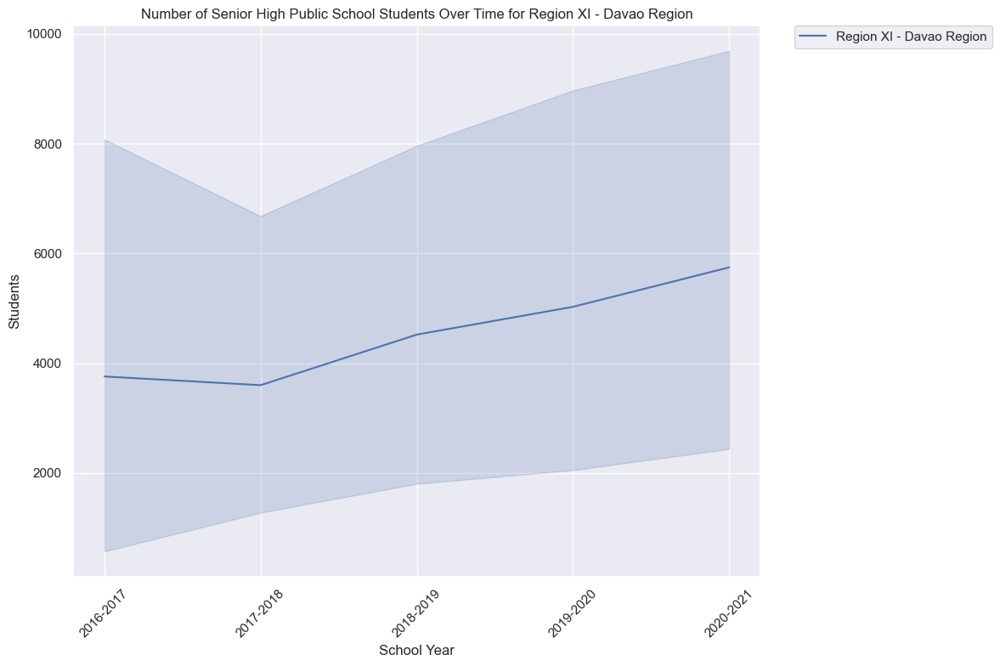

--- Region XI - Davao Region ---


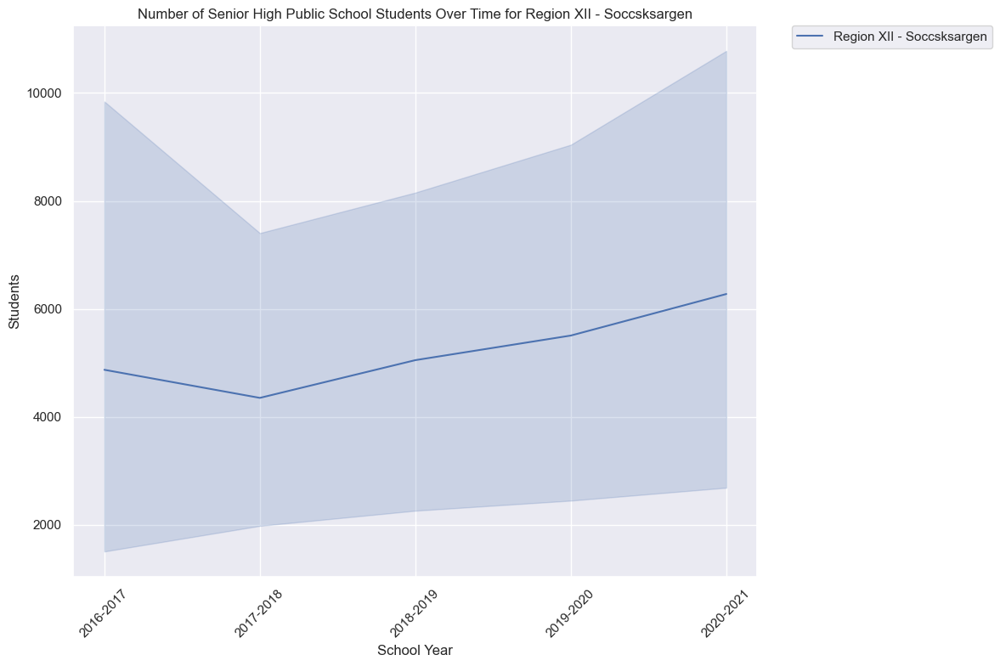

--- Region XII - Soccsksargen ---


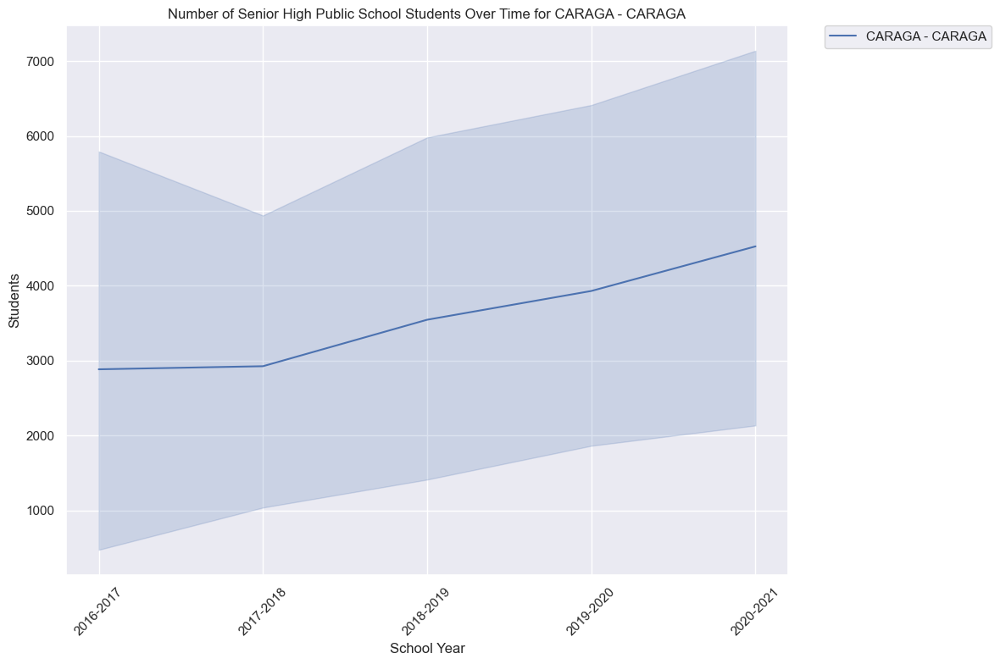

--- CARAGA - CARAGA ---


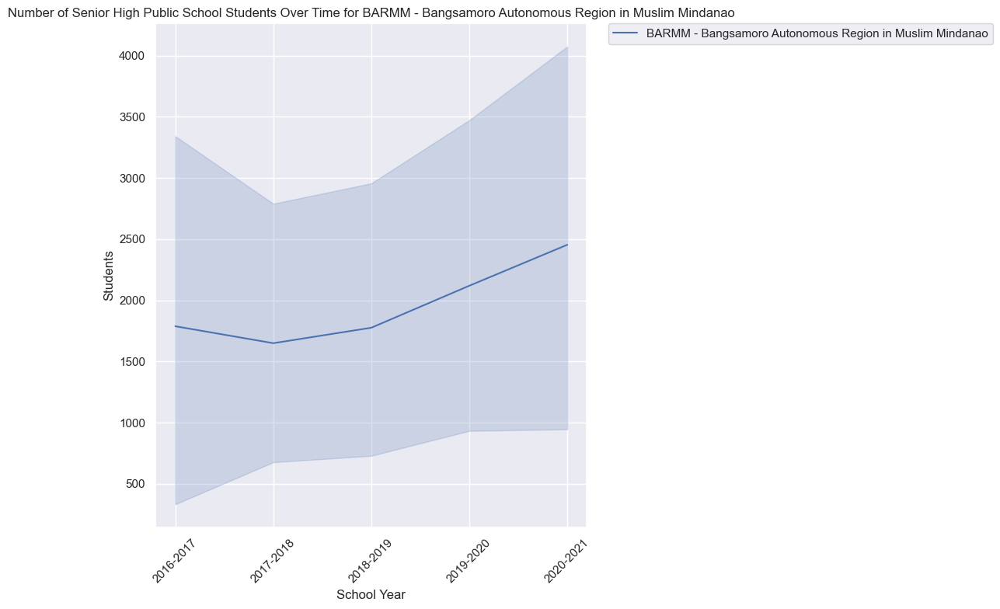

--- BARMM - Bangsamoro Autonomous Region in Muslim Mindanao ---


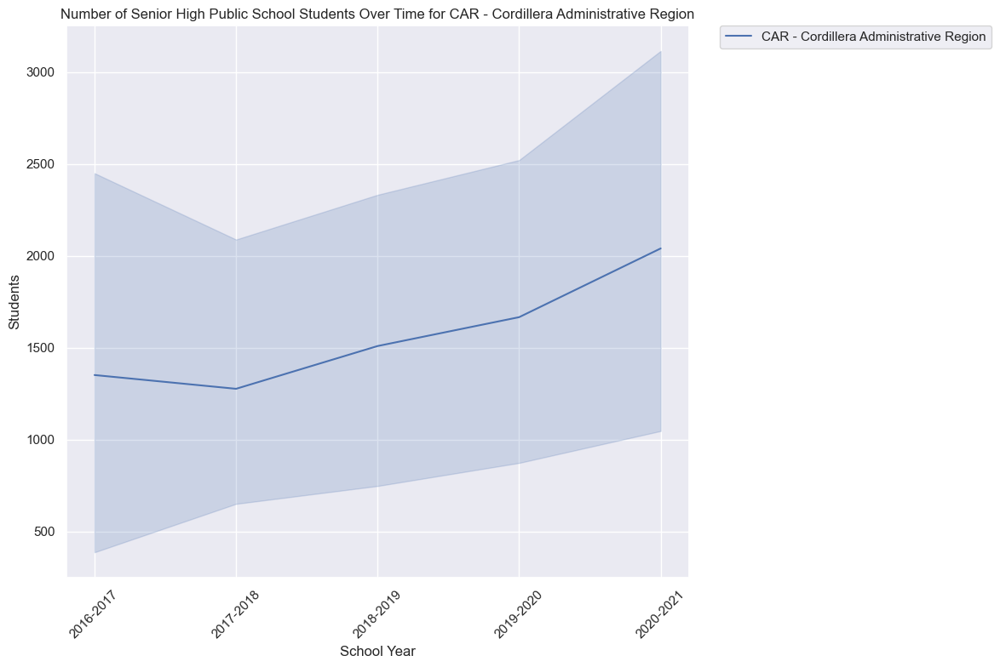

--- CAR - Cordillera Administrative Region ---


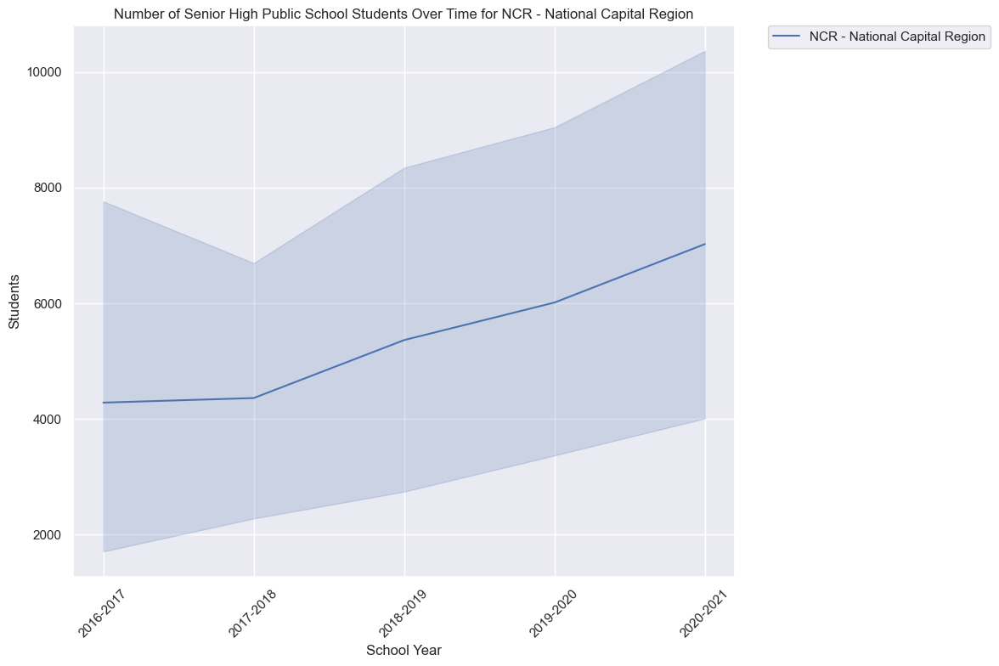

--- NCR - National Capital Region ---


In [47]:
def number_of_students_over_time_and_region(melted_df, region=None):
    sns.set_theme(style="darkgrid")

    # Ensure 'School Year' is treated as a categorical variable for better visualization
    melted_df['School Year'] = melted_df['School Year'].astype(str)
    
    # Create a figure
    plt.figure(figsize=(12, 8))
    
    if region:
        # Filter for specific region if provided
        filtered_df = melted_df[melted_df['Region'] == region]
        title_suffix = f" for {region}"
    else:
        # Use all regions
        filtered_df = melted_df
        title_suffix = " by Region"
    
    # Create the line plot
    sns.lineplot(
        x="School Year",
        y="Students",
        hue="Region",  # Use Region as the hue
        data=filtered_df
    )
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Add a title and adjust layout
    plt.title(f"Number of Senior High Public School Students Over Time{title_suffix}")
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    # Adjust layout to prevent clipping
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Call the function with all regions
number_of_students_over_time_and_region(melted_df)

# Alternatively, call it for each region
regions = melted_df['Region'].unique()
for region in regions:
    number_of_students_over_time_and_region(melted_df, region)
    print(f"--- {region} ---")

In [ ]:
# Group by 'Level' and 'School Year' and calculate the total number of students
total_students_by_category_and_school_year = melted_df.groupby(['School Year'])['Students'].sum().reset_index()

# Rename columns for clarity
total_teachers_by_category_and_school_year.columns = ['School Category', 'Total Students', 'School Year']

# Display the result
print(total_students_by_category_and_school_year)

  School Year   Students
0   2016-2017   731981.0
1   2017-2018  1395142.0
2   2018-2019  1599637.0
3   2019-2020  1766818.0
4   2020-2021  1987180.0


In [ ]:
# Rename 'Grade Level' to 'Level' in melted_df to match df_teachers
melted_df.rename(columns={'Grade Level': 'Level'}, inplace=True)

In [ ]:
# Filter df_teachers to include only "Senior High" level
senior_high_teachers = df_teachers[df_teachers['Level'] == 'Senior High School']

# Group teachers by 'School Year' and 'Region' and calculate the total number of teachers
teachers_by_year_region = senior_high_teachers.groupby(['School Year', 'Region'])['Teachers'].sum().reset_index()

# Group students by 'School Year' and 'Region' and calculate the total number of students
students_by_year_region = melted_df.groupby(['School Year', 'Region'])['Students'].sum().reset_index()

# Merge the two DataFrames on 'School Year' and 'Region'
ratio_df = pd.merge(teachers_by_year_region, students_by_year_region, on=['School Year', 'Region'], how='inner')

# Calculate the ratio of teachers to students
ratio_df['Student-to-Teacher Ratio'] = ratio_df['Students'] / ratio_df['Teachers']

# Display the resulting DataFrame
print(ratio_df)

   School Year                                             Region  Teachers  \
0    2016-2017  BARMM - Bangsamoro Autonomous Region in Muslim...     934.0   
1    2016-2017             CAR - Cordillera Administrative Region     645.0   
2    2016-2017                                    CARAGA - CARAGA    1071.0   
3    2016-2017                      NCR - National Capital Region    3692.0   
4    2016-2017                           Region I - Ilocos Region    2082.0   
..         ...                                                ...       ...   
80   2020-2021                       Region VII - Central Visayas    6144.0   
81   2020-2021                      Region VIII - Eastern Visayas    4735.0   
82   2020-2021                       Region X - Northern Mindanao    3414.0   
83   2020-2021                           Region XI - Davao Region    3365.0   
84   2020-2021                          Region XII - Soccsksargen    3691.0   

    Students  Student-to-Teacher Ratio  
0    14307

In [ ]:
ratio_df['Student-to-Teacher Ratio'].describe()

count    85.000000
mean     28.058796
std       8.026744
min       9.280336
25%      25.565378
50%      27.072428
75%      28.733521
max      72.320611
Name: Student-to-Teacher Ratio, dtype: float64

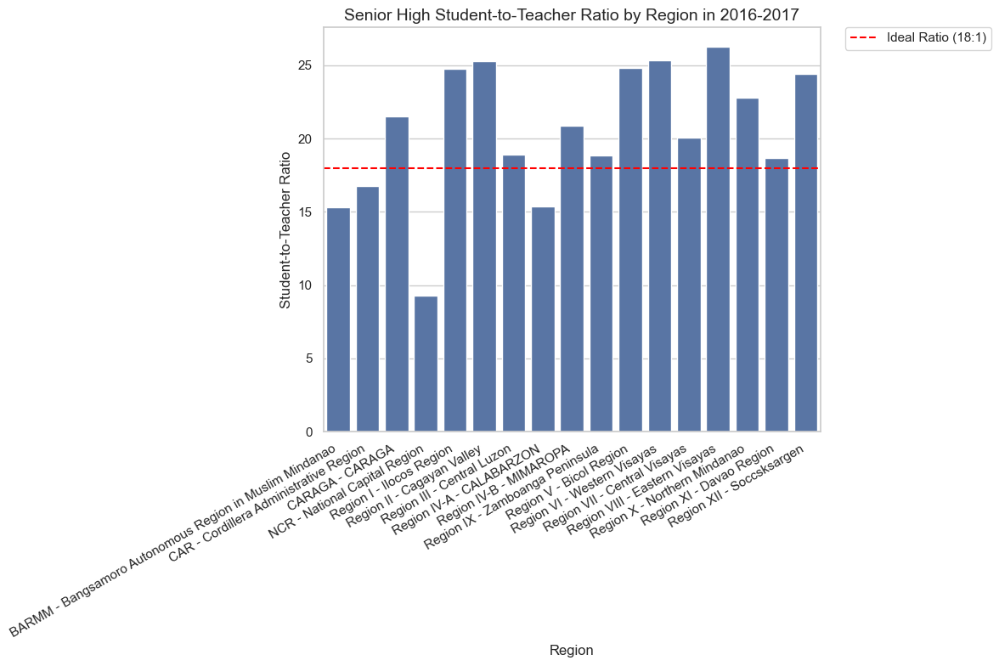

--- 2016-2017 ---


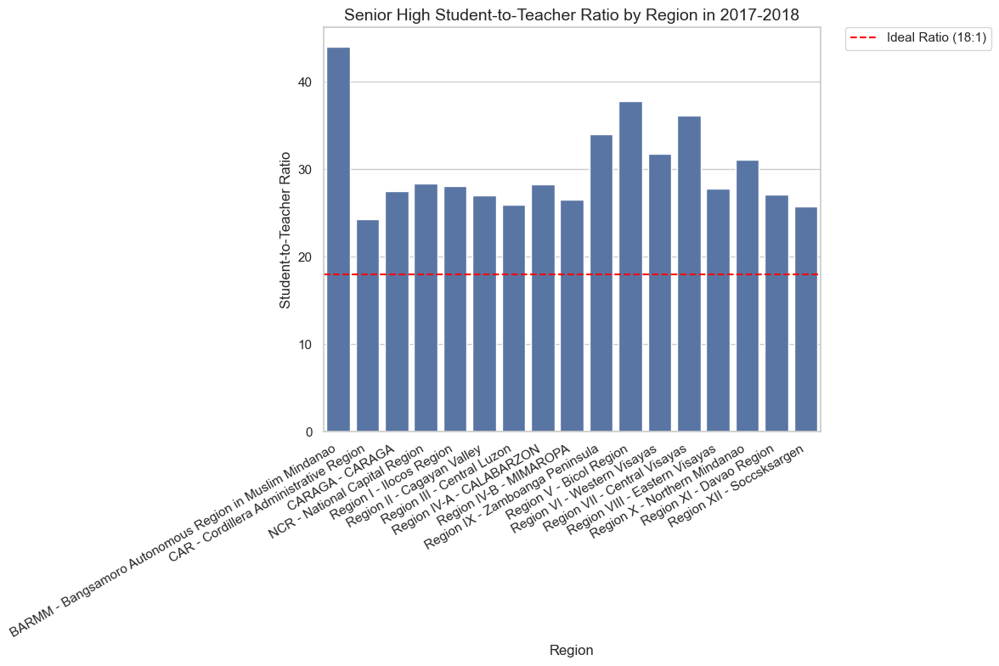

--- 2017-2018 ---


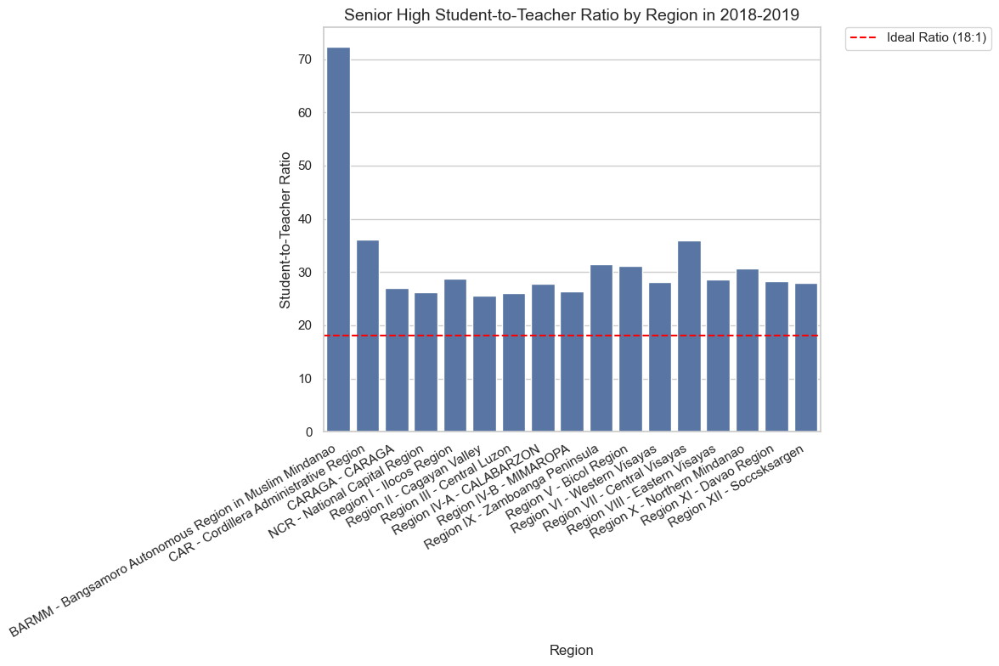

--- 2018-2019 ---


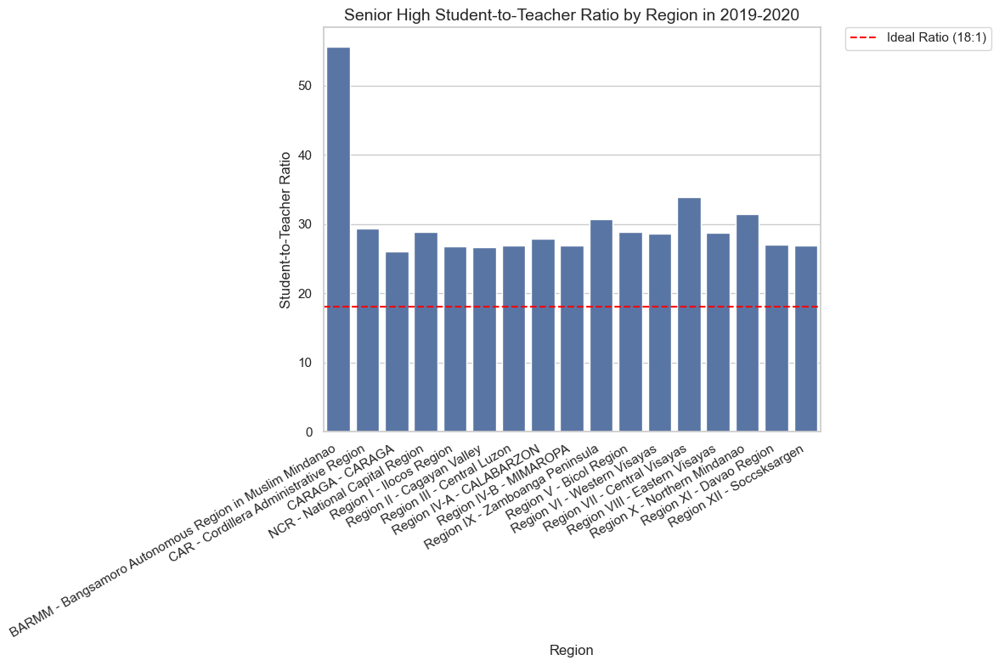

--- 2019-2020 ---


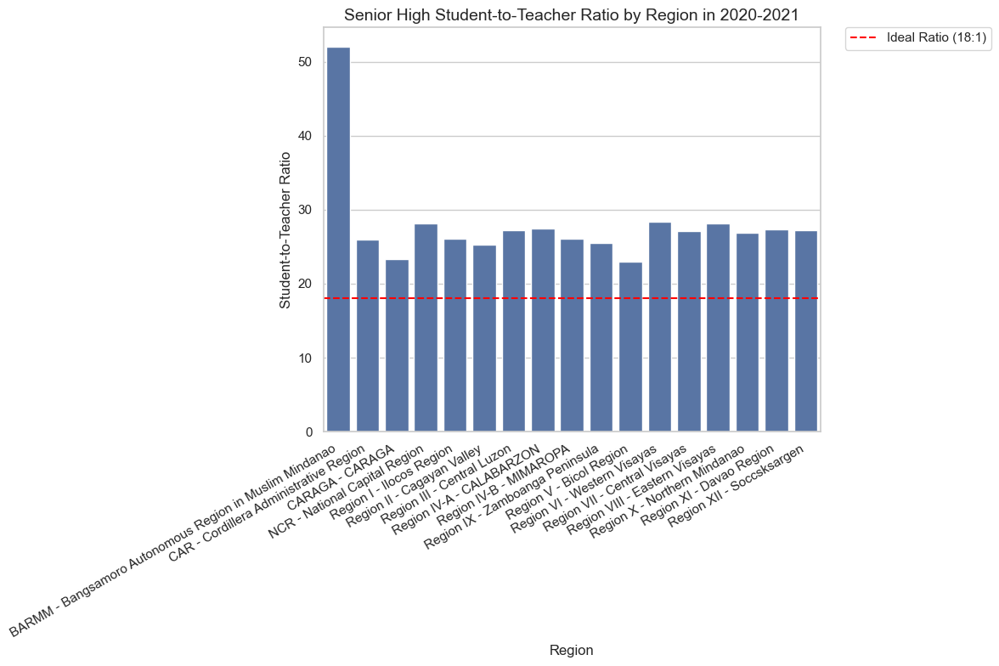

--- 2020-2021 ---


In [ ]:
def filter_and_plot_ratio(ratio_df, school_year):
    # Filter the DataFrame for the given school year
    student_teacher = ratio_df[ratio_df['School Year'] == school_year]
    student_teacher = student_teacher[['Region', 'School Year', 'Student-to-Teacher Ratio']]

    sns.set_theme(style="whitegrid")

    plt.figure(figsize=(12, 8))  # Increased figure size for better spacing
    sns.barplot(data=student_teacher, x="Region", y="Student-to-Teacher Ratio", dodge=True)

    plt.axhline(y=18, color='red', linestyle='--', label="Ideal Ratio (18:1)")

    plt.title(f"Senior High Student-to-Teacher Ratio by Region in {school_year}", fontsize=14)
    plt.xlabel("Region", fontsize=12)
    plt.ylabel("Student-to-Teacher Ratio", fontsize=12)
    plt.xticks(rotation=30, ha='right')  # Rotated labels and aligned them to the right
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    plt.tight_layout()

    plt.show()

# Loop through the school years and call the function
for year in ['2016-2017', '2017-2018', '2018-2019', '2019-2020', '2020-2021']:
    filter_and_plot_ratio(ratio_df, year)
    print(f"--- {year} ---")